In [32]:
import numpy as np
import pandas as pd

import sklearn
from sklearn import metrics

import shap
import statsmodels.api as sm

import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.patches as mpatches

from imblearn.over_sampling import SMOTE, ADASYN, RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler, EditedNearestNeighbours

import lightgbm as lgb

import sys
sys.path.append('../')
import importlib
import os
from joblib import dump, load

import model_util
importlib.reload(model_util)
from model_util import get_estimator_probabilities, get_scoring_metrics

import feature_sets
importlib.reload(feature_sets)

import feature_sets_rnfl
importlib.reload(feature_sets_rnfl)



#from sklearnex import patch_sklearn
#patch_sklearn()

<module 'feature_sets_rnfl' from '/mnt/shared_folders/eResearch_glaucoma_project/emma_summer2023/honours/models/../feature_sets_rnfl.py'>

In [ ]:
print(np.__version__)

# Load data

- Use min-max scaled X_train and X_test for all models for consistency, even if not required
- Use miceforest imputed data for all models (same reasoning)

<br>

### tte: 5 years

In [20]:
X_train_imputed_scaled_5year_tte = load('../data/imputed/IOPsubcohort_X_train_imputed_scaled_5year_tte.pkl')
y_train_5year_tte = load('../data/imputed/IOPsubcohort_y_train_5year_tte.pkl')

X_test_imputed_scaled_5year_tte = load('../data/imputed/IOPsubcohort_X_test_imputed_scaled_5year_tte.pkl')
y_test_5year_tte = load('../data/imputed/IOPsubcohort_y_test_5year_tte.pkl')

In [21]:
fitted_models_dir = './best_hyperparams_fitted/'

algorithm_display_names_5year_tte = {
    'LR': 'logistic_regression_sgd_5year_tte',
    'SVM': 'svm_5year_tte',
    'KNN': 'knn_5year_tte',
    'RF': 'randomforest_5year_tte',
    'XGBoost': 'xgboost_5year_tte',
    'LightGBM': 'lightgbm_5year_tte',
}

<br>

### matched 5 years

In [2]:
X_train_imputed_scaled_matched5year_tte = load('../data/imputed/IOPsubcohort_X_train_imputed_scaled_matched5year_tte.pkl')
y_train_matched5year_tte = load('../data/imputed/IOPsubcohort_y_train_matched5year_tte.pkl')

X_test_imputed_scaled_matched5year_tte = load('../data/imputed/IOPsubcohort_X_test_imputed_scaled_matched5year_tte.pkl')
y_test_matched5year_tte = load('../data/imputed/IOPsubcohort_y_test_matched5year_tte.pkl')

In [3]:
fitted_models_dir = './best_hyperparams_fitted/'

algorithm_display_names_matched5year_tte = {
    'LR': 'logistic_regression_sgd_matched5year_tte',
    'SVM': 'svm_matched5year_tte',
    'KNN': 'knn_matched5year_tte',
    'RF': 'randomforest_matched5year_tte',
    'XGBoost': 'xgboost_matched5year_tte',
    'LightGBM': 'lightgbm_matched5year_tte',
}

<br>

### IOP removed 5 year

In [3]:
X_train_imputed_scaled_IOPremoved5year_tte = load('../data/imputed/IOPsubcohort_X_train_imputed_scaled_IOPremoved5year_tte.pkl')
y_train_IOPremoved5year_tte = load('../data/imputed/IOPsubcohort_y_train_IOPremoved5year_tte.pkl')

X_test_imputed_scaled_IOPremoved5year_tte = load('../data/imputed/IOPsubcohort_X_test_imputed_scaled_IOPremoved5year_tte.pkl')
y_test_IOPremoved5year_tte = load('../data/imputed/IOPsubcohort_y_test_IOPremoved5year_tte.pkl')

In [9]:
fitted_models_dir = './best_hyperparams_fitted/'

algorithm_display_names_IOPremoved5year_tte = {
    'LR': 'logistic_regression_sgd_IOPremoved5year_tte',
    'SVM': 'svm_IOPremoved5year_tte',
    'KNN': 'knn_IOPremoved5year_tte',
    'RF': 'randomforest_IOPremoved5year_tte',
    'XGBoost': 'xgboost_IOPremoved5year_tte',
    'LightGBM': 'lightgbm_IOPremoved5year_tte',
}

<br>

### RNFL models 5 year

In [36]:
X_train_imputed_scaled_rnfl5year_tte = load('../data/imputed/IOPsubcohort_X_train_imputed_scaled_rnfl5year_tte.pkl')
y_train_rnfl5year_tte = load('../data/imputed/IOPsubcohort_y_train_rnfl5year_tte.pkl')

X_test_imputed_scaled_rnfl5year_tte = load('../data/imputed/IOPsubcohort_X_test_imputed_scaled_rnfl5year_tte.pkl')
y_test_rnfl5year_tte = load('../data/imputed/IOPsubcohort_y_test_rnfl5year_tte.pkl')

In [37]:
fitted_models_dir = './best_hyperparams_fitted/'

algorithm_display_names_rnfl5year_tte = {
    'LR': 'logistic_regression_sgd_rnfl5year_tte',
    'SVM': 'svm_rnfl5year_tte',
    'KNN': 'knn_rnfl5year_tte',
    'RF': 'randomforest_rnfl5year_tte',
    'XGBoost': 'xgboost_rnfl5year_tte',
    'LightGBM': 'lightgbm_rnfl5year_tte',
}

<br>

### no IOP RNFL 5 year


In [41]:
X_train_imputed_scaled_5year_tte = load('../data/imputed/IOPsubcohort_X_train_imputed_scaled_noIOPrnfl5year_tte.pkl')
y_train_5year_tte = load('../data/imputed/IOPsubcohort_y_train_noIOPrnfl5year_tte.pkl')

X_test_imputed_scaled_5year_tte = load('../data/imputed/IOPsubcohort_X_test_imputed_scaled_noIOPrnfl5year_tte.pkl')
y_test_5year_tte = load('../data/imputed/IOPsubcohort_y_test_noIOPrnfl5year_tte.pkl')

In [42]:
fitted_models_dir = './best_hyperparams_fitted/'

algorithm_display_names_5year_tte = {
    'LR': 'logistic_regression_sgd_noIOPrnfl5year_tte',
    'SVM': 'svm_noIOPrnfl5year_tte',
    'KNN': 'knn_noIOPrnfl5year_tte',
    'RF': 'randomforest_noIOPrnfl5year_tte',
    'XGBoost': 'xgboost_noIOPrnfl5year_tte',
    'LightGBM': 'lightgbm_noIOPrnfl5year_tte',
}

<br>

<br>

# Model accuracy

- Compare algorithms per feature set
- Compare best-performing algorithms across feature sets

### Function defs

In [31]:
def compare_estimator_auroc_bar(estimator_dict, y, best_model, ax):
    #ax.set_xlabel('Model')
    #ax.set_ylabel('Area under the receiver operating characteristic curve (AUROC)')

    x_arr = np.array([])
    y_arr = np.array([])

    errorbar_low_arr = np.array([])
    errorbar_high_arr = np.array([])

    ax.axhline(color='k', linestyle='dotted', y=0.5, xmin=0.05, xmax=0.95, label=f'Baseline: 0.5', alpha=0.7)

    for display_name, vals in estimator_dict.items():
        model_name = vals['model_name']
        auroc = vals['auroc']
        auroc_CI_low = vals['auroc_CI_low']
        auroc_CI_high = vals['auroc_CI_high']

        x_arr = np.append(x_arr, model_name)
        y_arr = np.append(y_arr, auroc)
        errorbar_low_arr = np.append(errorbar_low_arr, auroc - auroc_CI_low)
        errorbar_high_arr = np.append(errorbar_high_arr, auroc_CI_high - auroc)

    sns.barplot(x=x_arr, y=y_arr, hue=x_arr, ax=ax, legend=False)
    
    for display_name, vals in estimator_dict.items():
        model_name = vals['model_name']
        auroc = vals['auroc']
        #ax.text(model_name, 0.1, f'{auroc:0.3f}', va='center', ha='center', fontsize=8)
        if display_name == best_model:
            ax.text(model_name, 0.1, f'{auroc:0.3f}', va='center', ha='center', fontsize=8, fontweight='bold')
        else:
            ax.text(model_name, 0.1, f'{auroc:0.3f}', va='center', ha='center', fontsize=8)

    for label in ax.get_xticklabels():
        if label.get_text() == estimator_dict[best_model]['model_name']:
            label.set_fontweight('bold')
    
    #ax.bar_label(ax.containers[0], padding=40, fmt='%.3f')
    #ax.bar_label(ax.containers[0], padding=0, fmt='%.3f', label_type='center', fontsize=8)

    #for bar in ax.containers[0]:
    #     plt.text(bar.get_x(), 0.95, f'{bar.get_height():0.3f}')
    
    ax.errorbar(
        x=x_arr, y=y_arr,
        yerr = [errorbar_low_arr, errorbar_high_arr],
        fmt='none',
        ecolor='k',
        elinewidth=1,
        capsize=6,
    )

    ax.set_ylim([0, 1])
    ax.set_yticks(np.linspace(0, 1, 11))


    
    #if save_dir:
    #    plt.savefig(f'{save_dir}/bar_auroc.png', dpi=600, bbox_inches='tight', pad_inches=0)

    #plt.show()

# V2

def compare_estimator_roc(estimator_dict, y, ax):

    ax.set_xlim([-0.01, 1.01])
    ax.set_ylim([-0.01, 1.01])
    #ax.set_xlabel('1 - Specificity (false positive rate)')
    #ax.set_ylabel('Sensitivity (true positive rate)')

    ax.plot([0, 1], [0, 1], 'k:', label='Baseline: 0.500', alpha=0.7)

    for display_name, vals in estimator_dict.items():
        estimator = vals['estimator']
        label = vals['roc_label']
        X = vals['X']
        
        probabilities = get_estimator_probabilities(estimator, X)
        fpr_arr, tpr_arr, trial_t_arr = metrics.roc_curve(y, probabilities, pos_label=1, drop_intermediate=False)
        scoring_metrics = get_scoring_metrics(estimator, X, y)
        roc_auc = scoring_metrics['roc_auc']
        ax.plot(fpr_arr, tpr_arr, label=label, alpha=1)


    #ax.legend(loc='lower right')

    # if save_dir:
    #     plt.savefig(f'{save_dir}/roc.png', dpi=1000, bbox_inches='tight', pad_inches=0.1)

    #plt.show()

# V2

def compare_estimator_prc(estimator_dict, y, ax):

    ax.set_xlim([-0.01, 1.01])
    ax.set_ylim([-0.01, 1.01])
    #ax.set_xlabel('1 - Specificity (false positive rate)')
    #ax.set_ylabel('Sensitivity (true positive rate)')

    # Baseline = glaucoma prevalence
    n_pos = (y == 1).sum()
    n_total = len(y)
    baseline_y = n_pos / n_total
    ax.hlines(colors='k', linestyles='dotted', y=baseline_y, xmin=0, xmax=1, label=f'Baseline: {baseline_y:0.3f}', alpha=0.7)
   
    for display_name, vals in estimator_dict.items():
        estimator = vals['estimator']
        label = vals['roc_label']
        X = vals['X']
        
        probabilities = get_estimator_probabilities(estimator, X)
        precision, recall, pr_t = metrics.precision_recall_curve(y, probabilities, pos_label=1, drop_intermediate=True)
        pr_auc = metrics.auc(recall, precision)
        ax.plot(recall, precision, label=label, alpha=1)

 
    #ax.legend(loc='upper right', fontsize=8)


    # if save_dir:
    #     plt.savefig(f'{save_dir}/roc.png', dpi=1000, bbox_inches='tight', pad_inches=0.1)

    #plt.show()

### Compare algorithms for each feature set

In [25]:
compare_feature_set_dict = model_feature_dict = {
    'ophthalmic': feature_sets.ophthalmic_features['feature'].values,
    'demographic': feature_sets.demographic_features['feature'].values,
    'systemic': feature_sets.systemic_features['feature'].values,
    'lifestyle': feature_sets.lifestyle_features['feature'].values,

    'OD': feature_sets.OD_features['feature'].values,
    'SL': feature_sets.SL_features['feature'].values,
    'ODSL': feature_sets.ODSL_features['feature'].values,
    #'ODS': feature_sets.ODS_features['feature'].values,
    'DSL': feature_sets.DSL_features['feature'].values, # Primary-care focused       

    #'minimal_features_rfecv': feature_sets.minimal_features_rfecv['feature'].values
}

<br>

<br>

<br>

## tte: 5 years

In [26]:
def compare_models(model_dict, save_dir=None, auroc_bar_ax=None, roc_ax=None, prc_ax=None):
    model_df = pd.DataFrame(columns=['Model'])
    model_df = model_df.set_index('Model', drop=True)

    estimator_dict = {}

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)

    for model_name, model_properties in model_dict.items():
        print(model_name)

        feature_set = model_feature_dict[model_properties['feature_set']]
        X = X_test_imputed_scaled_5year_tte[feature_set]

        estimator = load(f'{model_properties['save_dir']}.pkl')
        with open(f'{model_properties['save_dir']}_best_params.txt', 'r') as txt:
            params = txt.read()
        
        test_scoring_metrics = get_scoring_metrics(estimator, X, y_test_5year_tte)
        probabilities = get_estimator_probabilities(estimator, X)
        auroc = test_scoring_metrics['roc_auc']
        auprc = test_scoring_metrics['pr_auc']

        t = model_util.get_ideal_threshold(y_test_5year_tte, probabilities)

        btstrp_measures = model_util.get_bootstrapped_measures(y_test_5year_tte, probabilities, t).confidence_interval
        auroc_CI_low, auprc_CI_low, sensitivity_CI_low, specificity_CI_low, ppv_CI_low, npv_CI_low, f1_CI_low = btstrp_measures.low
        auroc_CI_high, auprc_CI_high, sensitivity_CI_high, specificity_CI_high, ppv_CI_high, npv_CI_high, f1_CI_high = btstrp_measures.high

        model_df.loc[model_name, 'Algorithm'] = model_properties['algorithm']
        model_df.loc[model_name, 'Parameters'] = params
        model_df.loc[model_name, 'AUROC'] = auroc
        model_df.loc[model_name, 'AUROC (95% CI)'] = f'{auroc:0.3f} ({auroc_CI_low:0.3f} - {auroc_CI_high:0.3f})'
       
        model_df.loc[model_name, 'Sensitivity (95% CI)'] = (
            f'{test_scoring_metrics['sensitivity_recall']:0.3f} '
            f'({sensitivity_CI_low:0.3f} - {sensitivity_CI_high:0.3f})'
        )
        
        model_df.loc[model_name, 'Specificity (95% CI)'] = (
            f'{test_scoring_metrics['specificity']:0.3f} '
            f'({specificity_CI_low:0.3f} - {specificity_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'PPV (95% CI)'] = (
            f'{test_scoring_metrics['ppv_precision']:0.3f} '
            f'({ppv_CI_low:0.3f} - {ppv_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'NPV (95% CI)'] = (
            f'{test_scoring_metrics['npv']:0.3f} '
            f'({npv_CI_low:0.3f} - {npv_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'F1 score (95% CI)'] = (
            f'{test_scoring_metrics['f1_score']:0.3f} '
            f'({f1_CI_low:0.3f} - {f1_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'AUPRC (95% CI)'] = (
            f'{auprc:0.3f} '
            f'({auprc_CI_low:0.3f} - {auprc_CI_high:0.3f})'
        )

        estimator_dict[model_name] = {
            'estimator': estimator,
            'model_name': model_name,
            'X': X,
            'probabilities': probabilities,
            'roc_label': f'{model_name}: {auroc:0.3f} ({auroc_CI_low:0.3f} - {auroc_CI_high:0.3f})',
            'prc_label': f'{model_name}: {auprc:0.3f} ({auprc_CI_low:0.3f} - {auprc_CI_high:0.3f})',

            'auroc': auroc,
            'auroc_CI_low': auroc_CI_low,
            'auroc_CI_high': auroc_CI_high,

            'auprc': auprc,
            'auprc_CI_low': auprc_CI_low,
            'auprc_CI_high': auprc_CI_high,

            'f1_score': test_scoring_metrics['f1_score'],
            'f1_CI_low': f1_CI_low,
            'f1_CI_high': f1_CI_high,
            
            'sensitivity_recall': test_scoring_metrics['sensitivity_recall'],
            'sensitivity_CI_low': sensitivity_CI_low,
            'sensitivity_CI_high': sensitivity_CI_high,
            
            'specificity': test_scoring_metrics['specificity'],
            'specificity_CI_low': specificity_CI_low,
            'specificity_CI_high': specificity_CI_high,
        }

    best_model = model_df['AUROC'].idxmax()
    best_model_dict = model_dict[best_model]
    best_model_algorithm = best_model_dict['algorithm']
    print(f'Best model: {best_model} ({best_model_algorithm})')

    if auroc_bar_ax != None:
        compare_estimator_auroc_bar(estimator_dict, y_test_5year_tte, best_model=best_model, ax=auroc_bar_ax)
    compare_estimator_roc(estimator_dict, y_test_5year_tte, ax=roc_ax)
    compare_estimator_prc(estimator_dict, y_test_5year_tte, ax=prc_ax)


    display(model_df.style.set_properties(**{
        'white-space': 'pre-wrap',
    }))

    if save_dir:
        model_df.to_csv(f'{save_dir}/comparison_results_5year_tte.tsv', sep='\t')
        # Save best model as txt
        with open(f'{save_dir}/best_model_5year_tte.txt', 'w+') as txt:
            txt.write(best_model)
        with open(f'{save_dir}/best_algorithm_5year_tte.txt', 'w+') as txt:
            txt.write(best_model_algorithm)

   # plt.show()

ophthalmic
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: SVM (svm_5year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_5year_tte,alpha: 7.135873973762193e-06 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.791326,0.791 (0.739 - 0.841),0.547 (0.446 - 0.647),0.905 (0.901 - 0.909),0.025 (0.018 - 0.031),0.998 (0.997 - 0.998),0.047 (0.035 - 0.060),0.034 (0.021 - 0.054)
SVM,svm_5year_tte,C: 4.663461720239888e-05 kernel: rbf gamma: 1.002679035458818e-06 random_state: 2024 cache_size: 7000 max_iter: 1000,0.801740,0.802 (0.751 - 0.850),0.779 (0.692 - 0.861),0.704 (0.698 - 0.710),0.011 (0.009 - 0.014),0.999 (0.998 - 0.999),0.022 (0.018 - 0.028),0.036 (0.022 - 0.057)
KNN,knn_5year_tte,n_neighbors: 469 weights: distance metric: euclidean algorithm: brute,0.767786,0.768 (0.710 - 0.823),0.653 (0.556 - 0.750),0.804 (0.798 - 0.809),0.014 (0.011 - 0.018),0.998 (0.997 - 0.999),0.028 (0.021 - 0.035),0.049 (0.023 - 0.098)
RF,randomforest_5year_tte,n_estimators: 365 max_depth: 8 max_features: 0.4250907162907488 min_samples_leaf: 188 max_samples: 0.5012287782869864 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.764972,0.765 (0.707 - 0.821),0.589 (0.489 - 0.688),0.852 (0.848 - 0.857),0.017 (0.013 - 0.022),0.998 (0.997 - 0.999),0.033 (0.025 - 0.042),0.060 (0.028 - 0.115)
XGBoost,xgboost_5year_tte,n_estimators: 456 learning_rate: 0.01574687216524522 max_depth: 4 subsample: 0.7184425501125402 colsample_bytree: 0.7283309698045641 gamma: 0.006437596626731803 lambda: 33.996553576145566 min_child_weight: 0.2663522224780693 max_bin: 917 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.770289,0.770 (0.713 - 0.825),0.705 (0.612 - 0.796),0.754 (0.749 - 0.760),0.012 (0.010 - 0.015),0.998 (0.998 - 0.999),0.024 (0.019 - 0.030),0.061 (0.028 - 0.112)
LightGBM,lightgbm_5year_tte,n_estimators: 319 max_bin: 760 learning_rate: 0.012758112606702296 max_depth: 6 num_leaves: 9 bagging_fraction: 0.5906320792702047 feature_fraction: 0.8604370953436329 lambda_l2: 3.8131482886160875 min_sum_hessian_in_leaf: 0.00010374178902815462 min_data_in_leaf: 1130 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.767093,0.767 (0.709 - 0.823),0.568 (0.466 - 0.667),0.880 (0.876 - 0.884),0.020 (0.015 - 0.026),0.998 (0.997 - 0.998),0.039 (0.029 - 0.049),0.059 (0.027 - 0.109)


demographic
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: LightGBM (lightgbm_5year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_5year_tte,alpha: 5.1292796795516444e-06 learning_rate: constant eta0: 0.07774105127288879 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.763435,0.763 (0.717 - 0.808),0.737 (0.647 - 0.824),0.654 (0.648 - 0.661),0.009 (0.007 - 0.011),0.998 (0.998 - 0.999),0.018 (0.014 - 0.023),0.017 (0.011 - 0.040)
SVM,svm_5year_tte,C: 0.006893815419739066 kernel: linear random_state: 2024 cache_size: 7000 max_iter: 1000,0.483552,0.484 (0.425 - 0.542),0.526 (0.426 - 0.628),0.509 (0.502 - 0.515),0.005 (0.003 - 0.006),0.996 (0.995 - 0.997),0.009 (0.007 - 0.012),0.004 (0.003 - 0.005)
KNN,knn_5year_tte,n_neighbors: 487 weights: uniform metric: euclidean algorithm: brute,0.698736,0.699 (0.642 - 0.752),0.758 (0.667 - 0.843),0.527 (0.520 - 0.534),0.007 (0.005 - 0.009),0.998 (0.997 - 0.999),0.014 (0.011 - 0.017),0.012 (0.008 - 0.019)
RF,randomforest_5year_tte,n_estimators: 478 max_depth: 5 max_features: 0.6724219574299433 min_samples_leaf: 456 max_samples: 0.6542126379887907 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.764779,0.765 (0.718 - 0.810),0.747 (0.659 - 0.832),0.651 (0.645 - 0.658),0.009 (0.007 - 0.011),0.998 (0.998 - 0.999),0.018 (0.014 - 0.023),0.018 (0.011 - 0.040)
XGBoost,xgboost_5year_tte,n_estimators: 464 learning_rate: 0.0035301101672124365 max_depth: 3 subsample: 0.8483688653437728 colsample_bytree: 0.9923615644750743 gamma: 0.0014962442231604423 lambda: 1.3145496606055522 min_child_weight: 0.00017056659196402888 max_bin: 477 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.766813,0.767 (0.719 - 0.813),0.632 (0.533 - 0.728),0.771 (0.766 - 0.777),0.012 (0.009 - 0.015),0.998 (0.997 - 0.999),0.023 (0.018 - 0.029),0.019 (0.012 - 0.036)
LightGBM,lightgbm_5year_tte,n_estimators: 499 max_bin: 271 learning_rate: 0.005269543889540207 max_depth: 3 num_leaves: 32 bagging_fraction: 0.7417154124465895 feature_fraction: 0.9674801382137298 lambda_l2: 0.7103402706811116 min_sum_hessian_in_leaf: 0.00020220358722875998 min_data_in_leaf: 848 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.769627,0.770 (0.723 - 0.815),0.758 (0.671 - 0.840),0.646 (0.640 - 0.652),0.009 (0.007 - 0.011),0.998 (0.998 - 0.999),0.018 (0.014 - 0.023),0.020 (0.012 - 0.046)


systemic
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: RF (randomforest_5year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_5year_tte,alpha: 4.710067812786409e-06 learning_rate: adaptive eta0: 0.0928327509980999 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.656539,0.657 (0.600 - 0.712),0.621 (0.521 - 0.716),0.633 (0.627 - 0.640),0.007 (0.006 - 0.009),0.997 (0.997 - 0.998),0.015 (0.011 - 0.018),0.009 (0.006 - 0.014)
SVM,svm_5year_tte,C: 3.327895134818204e-05 kernel: rbf gamma: 0.7856931660395939 random_state: 2024 cache_size: 7000 max_iter: 1000,0.582019,0.582 (0.523 - 0.640),0.337 (0.242 - 0.431),0.806 (0.801 - 0.811),0.008 (0.005 - 0.010),0.996 (0.995 - 0.997),0.015 (0.010 - 0.020),0.006 (0.004 - 0.009)
KNN,knn_5year_tte,n_neighbors: 495 weights: distance metric: euclidean algorithm: brute,0.534459,0.534 (0.479 - 0.591),0.842 (0.764 - 0.913),0.266 (0.260 - 0.272),0.005 (0.004 - 0.006),0.997 (0.996 - 0.999),0.010 (0.008 - 0.012),0.005 (0.004 - 0.006)
RF,randomforest_5year_tte,n_estimators: 385 max_depth: 46 max_features: 0.05214875562137042 min_samples_leaf: 1030 max_samples: 0.5558128907504065 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.673806,0.674 (0.621 - 0.727),0.684 (0.592 - 0.779),0.601 (0.594 - 0.607),0.007 (0.006 - 0.009),0.998 (0.997 - 0.998),0.015 (0.011 - 0.018),0.013 (0.007 - 0.042)
XGBoost,xgboost_5year_tte,n_estimators: 173 learning_rate: 0.004875171032948106 max_depth: 3 subsample: 0.5302560514683357 colsample_bytree: 0.9312406446222345 gamma: 0.008173230017009961 lambda: 459.3402167409022 min_child_weight: 3.5022077910874585 max_bin: 650 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.672040,0.672 (0.618 - 0.726),0.674 (0.578 - 0.768),0.613 (0.606 - 0.619),0.008 (0.006 - 0.010),0.998 (0.997 - 0.998),0.015 (0.012 - 0.019),0.010 (0.007 - 0.015)
LightGBM,lightgbm_5year_tte,n_estimators: 114 max_bin: 925 learning_rate: 0.00135316105566247 max_depth: 3 num_leaves: 103 bagging_fraction: 0.9595370834322435 feature_fraction: 0.7505656318611048 lambda_l2: 0.009515842763565522 min_sum_hessian_in_leaf: 0.07187977992289728 min_data_in_leaf: 510 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.663762,0.664 (0.608 - 0.718),0.632 (0.535 - 0.726),0.652 (0.646 - 0.658),0.008 (0.006 - 0.010),0.998 (0.997 - 0.998),0.016 (0.012 - 0.020),0.008 (0.006 - 0.011)


lifestyle
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: LightGBM (lightgbm_5year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_5year_tte,alpha: 0.0001716093009783706 learning_rate: constant eta0: 0.02006422142772076 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.514491,0.514 (0.454 - 0.574),0.505 (0.402 - 0.605),0.586 (0.580 - 0.593),0.005 (0.004 - 0.007),0.996 (0.995 - 0.997),0.011 (0.008 - 0.014),0.006 (0.004 - 0.014)
SVM,svm_5year_tte,C: 0.04293111201756401 kernel: poly gamma: 4.039285558288821e-06 degree: 2 random_state: 2024 cache_size: 7000 max_iter: 1000,0.444464,0.444 (0.387 - 0.502),0.979 (0.945 - 1.000),0.055 (0.052 - 0.058),0.005 (0.004 - 0.005),0.998 (0.996 - 1.000),0.009 (0.007 - 0.011),0.004 (0.003 - 0.007)
KNN,knn_5year_tte,n_neighbors: 335 weights: distance metric: cosine algorithm: brute,0.525152,0.525 (0.467 - 0.583),0.537 (0.434 - 0.639),0.571 (0.565 - 0.578),0.005 (0.004 - 0.007),0.996 (0.995 - 0.997),0.011 (0.008 - 0.014),0.005 (0.003 - 0.006)
RF,randomforest_5year_tte,n_estimators: 55 max_depth: 24 max_features: 0.4647308260943704 min_samples_leaf: 10 max_samples: 0.5429324427109088 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.536217,0.536 (0.473 - 0.599),0.400 (0.299 - 0.500),0.712 (0.706 - 0.718),0.006 (0.004 - 0.008),0.996 (0.995 - 0.997),0.012 (0.008 - 0.016),0.006 (0.004 - 0.010)
XGBoost,xgboost_5year_tte,n_estimators: 450 learning_rate: 0.18876045183570467 max_depth: 12 subsample: 0.6054445891165912 colsample_bytree: 0.645234360865269 gamma: 0.01739036439949712 lambda: 1.5749588179721274 min_child_weight: 0.004911305181066188 max_bin: 601 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.548014,0.548 (0.491 - 0.603),0.758 (0.667 - 0.841),0.389 (0.383 - 0.396),0.005 (0.004 - 0.007),0.997 (0.996 - 0.998),0.011 (0.008 - 0.013),0.005 (0.004 - 0.008)
LightGBM,lightgbm_5year_tte,n_estimators: 281 max_bin: 981 learning_rate: 0.09407074402771404 max_depth: 11 num_leaves: 65 bagging_fraction: 0.6685849257169202 feature_fraction: 0.7200537131525425 lambda_l2: 0.10854467333951467 min_sum_hessian_in_leaf: 3.5838810924151687 min_data_in_leaf: 395 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.553878,0.554 (0.491 - 0.616),0.442 (0.342 - 0.544),0.680 (0.673 - 0.686),0.006 (0.004 - 0.008),0.996 (0.995 - 0.997),0.012 (0.008 - 0.016),0.006 (0.004 - 0.009)


OD
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: XGBoost (xgboost_5year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_5year_tte,alpha: 3.967886186626982e-06 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.827318,0.827 (0.785 - 0.868),0.747 (0.656 - 0.835),0.790 (0.785 - 0.795),0.015 (0.012 - 0.019),0.999 (0.998 - 0.999),0.030 (0.023 - 0.037),0.037 (0.021 - 0.067)
SVM,svm_5year_tte,C: 0.032679788765473256 kernel: poly gamma: 3.873320846586485e-06 degree: 3 random_state: 2024 cache_size: 7000 max_iter: 1000,0.721855,0.722 (0.666 - 0.776),0.663 (0.566 - 0.757),0.674 (0.668 - 0.680),0.009 (0.007 - 0.011),0.998 (0.997 - 0.999),0.017 (0.013 - 0.022),0.015 (0.009 - 0.026)
KNN,knn_5year_tte,n_neighbors: 495 weights: uniform metric: manhattan algorithm: brute,0.748506,0.749 (0.698 - 0.796),0.716 (0.624 - 0.805),0.641 (0.635 - 0.647),0.009 (0.007 - 0.011),0.998 (0.997 - 0.999),0.017 (0.013 - 0.021),0.020 (0.012 - 0.047)
RF,randomforest_5year_tte,n_estimators: 295 max_depth: 35 max_features: 0.6140829619101505 min_samples_leaf: 407 max_samples: 0.8199721139245385 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.816872,0.817 (0.766 - 0.864),0.768 (0.682 - 0.851),0.776 (0.770 - 0.782),0.015 (0.012 - 0.018),0.999 (0.998 - 0.999),0.029 (0.023 - 0.036),0.066 (0.030 - 0.122)
XGBoost,xgboost_5year_tte,n_estimators: 280 learning_rate: 0.013172813403548344 max_depth: 4 subsample: 0.7760763240841895 colsample_bytree: 0.5219996762085779 gamma: 0.003170767032031884 lambda: 4.0718586900384715 min_child_weight: 0.12976399316307777 max_bin: 924 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.832427,0.832 (0.787 - 0.874),0.663 (0.565 - 0.760),0.872 (0.867 - 0.876),0.022 (0.017 - 0.028),0.998 (0.998 - 0.999),0.043 (0.033 - 0.053),0.077 (0.039 - 0.139)
LightGBM,lightgbm_5year_tte,n_estimators: 373 max_bin: 272 learning_rate: 0.012721098288196236 max_depth: 4 num_leaves: 67 bagging_fraction: 0.5821183283063536 feature_fraction: 0.6078359761690997 lambda_l2: 0.9148249026250815 min_sum_hessian_in_leaf: 2.888896990993339 min_data_in_leaf: 645 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.831365,0.831 (0.785 - 0.874),0.642 (0.543 - 0.738),0.888 (0.884 - 0.893),0.025 (0.019 - 0.031),0.998 (0.998 - 0.999),0.047 (0.036 - 0.059),0.075 (0.039 - 0.137)


SL
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: XGBoost (xgboost_5year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_5year_tte,alpha: 1.0021469449685715e-05 learning_rate: constant eta0: 0.0970846135649913 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.639797,0.640 (0.584 - 0.693),0.663 (0.565 - 0.758),0.591 (0.585 - 0.598),0.007 (0.005 - 0.009),0.998 (0.997 - 0.998),0.014 (0.011 - 0.017),0.008 (0.005 - 0.013)
SVM,svm_5year_tte,C: 0.14887853405441143 kernel: rbf gamma: 0.93923124657894 random_state: 2024 cache_size: 7000 max_iter: 1000,0.547136,0.547 (0.483 - 0.610),0.326 (0.233 - 0.423),0.809 (0.804 - 0.815),0.007 (0.005 - 0.010),0.996 (0.995 - 0.997),0.015 (0.010 - 0.020),0.006 (0.004 - 0.008)
KNN,knn_5year_tte,n_neighbors: 483 weights: distance metric: cosine algorithm: brute,0.511845,0.512 (0.458 - 0.566),0.800 (0.716 - 0.878),0.275 (0.269 - 0.281),0.005 (0.004 - 0.006),0.997 (0.995 - 0.998),0.010 (0.007 - 0.012),0.004 (0.003 - 0.006)
RF,randomforest_5year_tte,n_estimators: 226 max_depth: 21 max_features: 0.029797961943755606 min_samples_leaf: 826 max_samples: 0.8871368469694241 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.648071,0.648 (0.594 - 0.700),0.695 (0.600 - 0.786),0.574 (0.568 - 0.581),0.007 (0.005 - 0.009),0.998 (0.997 - 0.998),0.014 (0.011 - 0.017),0.012 (0.006 - 0.041)
XGBoost,xgboost_5year_tte,n_estimators: 308 learning_rate: 0.0011593233014363334 max_depth: 6 subsample: 0.8557884640544101 colsample_bytree: 0.5725986919278997 gamma: 0.6684626165537688 lambda: 0.0592869593008204 min_child_weight: 0.029573959873765966 max_bin: 1023 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.677195,0.677 (0.620 - 0.734),0.505 (0.404 - 0.606),0.779 (0.773 - 0.785),0.010 (0.007 - 0.013),0.997 (0.996 - 0.998),0.019 (0.014 - 0.025),0.012 (0.007 - 0.024)
LightGBM,lightgbm_5year_tte,n_estimators: 327 max_bin: 130 learning_rate: 0.0013718053187228617 max_depth: 3 num_leaves: 43 bagging_fraction: 0.9579340337375458 feature_fraction: 0.5511674316964764 lambda_l2: 0.30552285582632316 min_sum_hessian_in_leaf: 4.347130586121248 min_data_in_leaf: 4458 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.667831,0.668 (0.613 - 0.722),0.789 (0.705 - 0.871),0.502 (0.495 - 0.508),0.007 (0.005 - 0.008),0.998 (0.997 - 0.999),0.014 (0.011 - 0.017),0.010 (0.006 - 0.021)


ODSL
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: XGBoost (xgboost_5year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_5year_tte,alpha: 9.981791598698652e-06 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.835692,0.836 (0.795 - 0.874),0.695 (0.600 - 0.788),0.831 (0.826 - 0.836),0.018 (0.014 - 0.022),0.998 (0.998 - 0.999),0.035 (0.027 - 0.043),0.034 (0.020 - 0.062)
SVM,svm_5year_tte,C: 4.331272543728752 kernel: rbf gamma: 0.35251364116963313 random_state: 2024 cache_size: 7000 max_iter: 1000,0.692895,0.693 (0.637 - 0.746),0.579 (0.478 - 0.677),0.730 (0.724 - 0.736),0.009 (0.007 - 0.012),0.997 (0.997 - 0.998),0.018 (0.014 - 0.023),0.012 (0.008 - 0.020)
KNN,knn_5year_tte,n_neighbors: 487 weights: distance metric: manhattan algorithm: brute,0.636816,0.637 (0.579 - 0.694),0.432 (0.333 - 0.533),0.802 (0.797 - 0.807),0.009 (0.007 - 0.012),0.997 (0.996 - 0.998),0.019 (0.013 - 0.024),0.008 (0.006 - 0.013)
RF,randomforest_5year_tte,n_estimators: 91 max_depth: 27 max_features: 0.9794206647555728 min_samples_leaf: 708 max_samples: 0.724144467398566 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.824829,0.825 (0.779 - 0.867),0.726 (0.634 - 0.814),0.803 (0.798 - 0.809),0.016 (0.012 - 0.020),0.999 (0.998 - 0.999),0.031 (0.024 - 0.039),0.101 (0.060 - 0.149)
XGBoost,xgboost_5year_tte,n_estimators: 261 learning_rate: 0.007158910194992581 max_depth: 6 subsample: 0.782286231541493 colsample_bytree: 0.588671867281882 gamma: 0.00015442707213127275 lambda: 0.012079926366018639 min_child_weight: 5.067017713199338 max_bin: 783 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.844798,0.845 (0.805 - 0.882),0.811 (0.728 - 0.887),0.724 (0.718 - 0.730),0.013 (0.010 - 0.016),0.999 (0.998 - 0.999),0.025 (0.020 - 0.031),0.069 (0.036 - 0.124)
LightGBM,lightgbm_5year_tte,n_estimators: 213 max_bin: 236 learning_rate: 0.02061027829820066 max_depth: 4 num_leaves: 59 bagging_fraction: 0.8514565515748497 feature_fraction: 0.7949970165653393 lambda_l2: 18.46532334273269 min_sum_hessian_in_leaf: 0.39046168893792366 min_data_in_leaf: 1251 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.844025,0.844 (0.804 - 0.882),0.789 (0.704 - 0.871),0.762 (0.756 - 0.767),0.014 (0.011 - 0.018),0.999 (0.998 - 0.999),0.028 (0.022 - 0.034),0.066 (0.035 - 0.117)


DSL
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: LightGBM (lightgbm_5year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_5year_tte,alpha: 1.4541016232737351e-05 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.748286,0.748 (0.703 - 0.792),0.705 (0.613 - 0.797),0.696 (0.690 - 0.702),0.010 (0.008 - 0.012),0.998 (0.997 - 0.999),0.020 (0.015 - 0.024),0.027 (0.010 - 0.059)
SVM,svm_5year_tte,C: 0.0004921500161545133 kernel: linear random_state: 2024 cache_size: 7000 max_iter: 1000,0.621695,0.622 (0.562 - 0.681),0.516 (0.414 - 0.617),0.726 (0.720 - 0.732),0.008 (0.006 - 0.011),0.997 (0.996 - 0.998),0.016 (0.012 - 0.021),0.008 (0.005 - 0.012)
KNN,knn_5year_tte,n_neighbors: 497 weights: distance metric: manhattan algorithm: brute,0.611458,0.611 (0.554 - 0.668),0.495 (0.393 - 0.596),0.711 (0.705 - 0.718),0.007 (0.005 - 0.010),0.997 (0.996 - 0.998),0.015 (0.011 - 0.019),0.006 (0.005 - 0.009)
RF,randomforest_5year_tte,n_estimators: 340 max_depth: 7 max_features: 0.8888345085811644 min_samples_leaf: 992 max_samples: 0.9111358507637777 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.760204,0.760 (0.712 - 0.806),0.621 (0.521 - 0.717),0.789 (0.783 - 0.794),0.013 (0.010 - 0.016),0.998 (0.997 - 0.999),0.025 (0.019 - 0.031),0.016 (0.010 - 0.029)
XGBoost,xgboost_5year_tte,n_estimators: 357 learning_rate: 0.0018270575559374397 max_depth: 6 subsample: 0.5377778807297133 colsample_bytree: 0.9457750032416071 gamma: 0.012419415624459947 lambda: 0.0025684853339400845 min_child_weight: 5.883736448559629 max_bin: 233 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.762836,0.763 (0.714 - 0.810),0.632 (0.533 - 0.728),0.789 (0.783 - 0.794),0.013 (0.010 - 0.016),0.998 (0.997 - 0.999),0.025 (0.019 - 0.032),0.017 (0.011 - 0.030)
LightGBM,lightgbm_5year_tte,n_estimators: 305 max_bin: 272 learning_rate: 0.0031280198936799847 max_depth: 4 num_leaves: 65 bagging_fraction: 0.6295873899214806 feature_fraction: 0.9992640263791235 lambda_l2: 0.030707432327594767 min_sum_hessian_in_leaf: 0.0013723409353397153 min_data_in_leaf: 934 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.772775,0.773 (0.725 - 0.818),0.716 (0.624 - 0.804),0.701 (0.694 - 0.707),0.010 (0.008 - 0.013),0.998 (0.998 - 0.999),0.020 (0.016 - 0.025),0.018 (0.012 - 0.031)


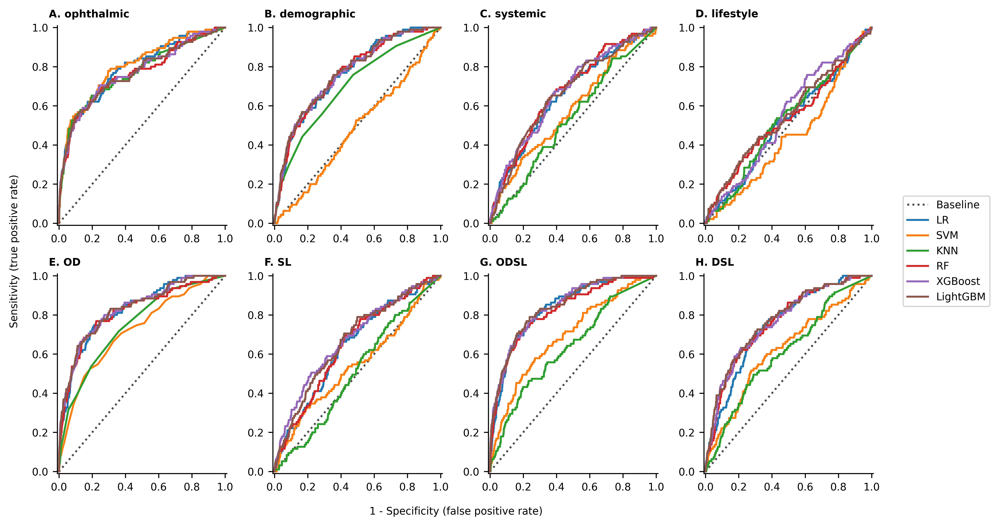

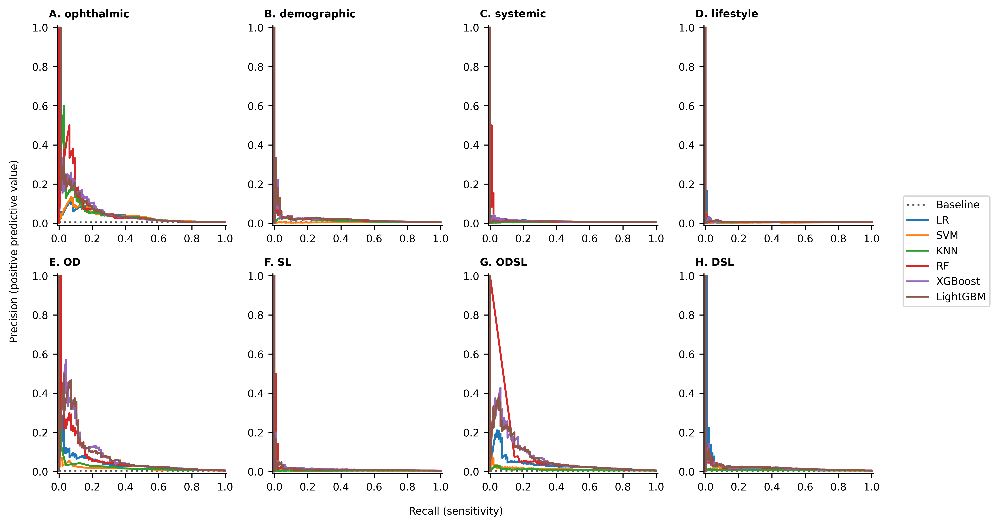

In [27]:
auroc_bar_fig, auroc_bar_axes = plt.subplots(4, 2, figsize=(35/2.54, 23/2.54), dpi=600, sharex=False, sharey=True)
roc_fig, roc_axes = plt.subplots(2, 4, figsize=(24/2.54, 14/2.54), dpi=600, sharex=False, sharey=False)
prc_fig, prc_axes = plt.subplots(2, 4, figsize=(24/2.54, 14/2.54), dpi=600, sharex=False, sharey=False)

auroc_bar_axes = auroc_bar_axes.flatten()
roc_axes = roc_axes.flatten()
prc_axes = prc_axes.flatten()

title_arr = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K']
#title_arr = ['i', 'ii', 'iii', 'iv', 'v', 'vi', 'vii', 'viii', 'ix', 'x']

for i, (feature_set_name, features) in zip(range(len(compare_feature_set_dict.items())), compare_feature_set_dict.items()):
    print(feature_set_name)
    
    subplot_title = title_arr[i]
    auroc_bar_ax = auroc_bar_axes[i]
    roc_ax = roc_axes[i]
    prc_ax = prc_axes[i]

    feature_set_dict = {}
    for display_name, algorithm in algorithm_display_names_5year_tte.items():
        feature_set_dict[display_name] = {
            'feature_set': feature_set_name,
            'save_dir': f'./{fitted_models_dir}/{feature_set_name}/{algorithm}',
            'algorithm': algorithm,
        }

    compare_models(
        feature_set_dict, f'./evaluation/{feature_set_name}',
        #X_test_imputed_scaled_5year_tte,
        #y_test_5year_tte,
        auroc_bar_ax=auroc_bar_ax, 
        roc_ax=roc_ax, 
        prc_ax=prc_ax,
    )
    
    auroc_bar_ax.text(-0.05, 1.03, f'{subplot_title}. {feature_set_name}', transform=auroc_bar_ax.transAxes, fontsize=8, fontweight='bold', va='bottom', ha='left')
    auroc_bar_ax.tick_params(axis='x', labelsize=8)
    auroc_bar_ax.tick_params(axis='y', labelsize=8)
    auroc_bar_ax.set_yticks(np.linspace(0, 1, 6))

    auroc_bar_ax.spines['top'].set_visible(False)
    auroc_bar_ax.spines['right'].set_visible(False)
    #auroc_bar_ax.spines['left'].set_visible(False)

    roc_ax.text(-0.05, 1.03, f'{subplot_title}. {feature_set_name}', transform=roc_ax.transAxes, fontsize=8, fontweight='bold', va='bottom', ha='left')
    roc_ax.tick_params(axis='x', labelsize=8)
    roc_ax.tick_params(axis='y', labelsize=8)
    roc_ax.set_xticks(np.linspace(0, 1, 6))
    roc_ax.set_yticks(np.linspace(0, 1, 6))
    roc_ax.spines['top'].set_visible(False)
    roc_ax.spines['right'].set_visible(False)

    prc_ax.text(-0.05, 1.03, f'{subplot_title}. {feature_set_name}', transform=prc_ax.transAxes, fontsize=8, fontweight='bold', va='bottom', ha='left')
    prc_ax.tick_params(axis='x', labelsize=8)
    prc_ax.tick_params(axis='y', labelsize=8)
    prc_ax.set_xticks(np.linspace(0, 1, 6))
    prc_ax.set_yticks(np.linspace(0, 1, 6))
    prc_ax.spines['top'].set_visible(False)
    prc_ax.spines['right'].set_visible(False)




# AUROC Bar
#auroc_bar_fig.yticks(np.linspace(0, 1, 6))
#auroc_bar_fig.tick_params(axis='y', labelsize=8)

legend_labels = ['Baseline (0.500)'] + list(algorithm_display_names_5year_tte.keys())

auroc_bar_fig.text(0.5, -0.01, 'Algorithm', ha='center', va='center', fontsize=8)
auroc_bar_fig.text(-0.01, 0.5, 'AUROC', ha='left', va='center', rotation='vertical', fontsize=8)
auroc_bar_fig.legend(loc='center', bbox_to_anchor=(1.01, 0, 0.1, 1), fontsize=8, labels=legend_labels, handles=roc_axes[0].lines)
auroc_bar_fig.tight_layout()
auroc_bar_fig.savefig(f'./evaluation/compare_feature_sets_auroc_bar_5year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
auroc_bar_fig.show()


# ROC
legend_labels = ['Baseline'] + list(algorithm_display_names_5year_tte.keys())

roc_fig.text(0.5, -0.01, '1 - Specificity (false positive rate)', ha='center', va='center', fontsize=8)
roc_fig.text(-0.01, 0.5, 'Sensitivity (true positive rate)', ha='left', va='center', rotation='vertical', fontsize=8)
roc_fig.legend(loc='center', bbox_to_anchor=(1.01, 0, 0.1, 1), fontsize=8, labels=legend_labels, handles=roc_axes[0].lines)
roc_fig.tight_layout()
roc_fig.savefig(f'./evaluation/compare_feature_sets_roc_5year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
roc_fig.show()

# PRC
prc_fig.text(0.5, -0.01, 'Recall (sensitivity)', ha='center', va='center', fontsize=8)
prc_fig.text(-0.01, 0.5, 'Precision (positive predictive value)', ha='left', va='center', rotation='vertical', fontsize=8)
prc_fig.legend(loc='center', bbox_to_anchor=(1.01, 0, 0.1, 1), fontsize=8, labels=legend_labels, handles=roc_axes[0].lines)
prc_fig.tight_layout()
prc_fig.savefig(f'./evaluation/compare_feature_sets_prc_5year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
prc_fig.show()

<br>

## matched 5 years

In [9]:
def compare_models(model_dict, save_dir=None, auroc_bar_ax=None, roc_ax=None, prc_ax=None):
    model_df = pd.DataFrame(columns=['Model'])
    model_df = model_df.set_index('Model', drop=True)

    estimator_dict = {}

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)

    for model_name, model_properties in model_dict.items():
        print(model_name)

        feature_set = model_feature_dict[model_properties['feature_set']]
        X = X_test_imputed_scaled_matched5year_tte[feature_set]

        estimator = load(f'{model_properties['save_dir']}.pkl')
        with open(f'{model_properties['save_dir']}_best_params.txt', 'r') as txt:
            params = txt.read()
        
        test_scoring_metrics = get_scoring_metrics(estimator, X, y_test_matched5year_tte)
        probabilities = get_estimator_probabilities(estimator, X)
        auroc = test_scoring_metrics['roc_auc']
        auprc = test_scoring_metrics['pr_auc']

        t = model_util.get_ideal_threshold(y_test_matched5year_tte, probabilities)

        btstrp_measures = model_util.get_bootstrapped_measures(y_test_matched5year_tte, probabilities, t).confidence_interval
        auroc_CI_low, auprc_CI_low, sensitivity_CI_low, specificity_CI_low, ppv_CI_low, npv_CI_low, f1_CI_low = btstrp_measures.low
        auroc_CI_high, auprc_CI_high, sensitivity_CI_high, specificity_CI_high, ppv_CI_high, npv_CI_high, f1_CI_high = btstrp_measures.high

        model_df.loc[model_name, 'Algorithm'] = model_properties['algorithm']
        model_df.loc[model_name, 'Parameters'] = params
        model_df.loc[model_name, 'AUROC'] = auroc
        model_df.loc[model_name, 'AUROC (95% CI)'] = f'{auroc:0.3f} ({auroc_CI_low:0.3f} - {auroc_CI_high:0.3f})'
       
        model_df.loc[model_name, 'Sensitivity (95% CI)'] = (
            f'{test_scoring_metrics['sensitivity_recall']:0.3f} '
            f'({sensitivity_CI_low:0.3f} - {sensitivity_CI_high:0.3f})'
        )
        
        model_df.loc[model_name, 'Specificity (95% CI)'] = (
            f'{test_scoring_metrics['specificity']:0.3f} '
            f'({specificity_CI_low:0.3f} - {specificity_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'PPV (95% CI)'] = (
            f'{test_scoring_metrics['ppv_precision']:0.3f} '
            f'({ppv_CI_low:0.3f} - {ppv_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'NPV (95% CI)'] = (
            f'{test_scoring_metrics['npv']:0.3f} '
            f'({npv_CI_low:0.3f} - {npv_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'F1 score (95% CI)'] = (
            f'{test_scoring_metrics['f1_score']:0.3f} '
            f'({f1_CI_low:0.3f} - {f1_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'AUPRC (95% CI)'] = (
            f'{auprc:0.3f} '
            f'({auprc_CI_low:0.3f} - {auprc_CI_high:0.3f})'
        )

        estimator_dict[model_name] = {
            'estimator': estimator,
            'model_name': model_name,
            'X': X,
            'probabilities': probabilities,
            'roc_label': f'{model_name}: {auroc:0.3f} ({auroc_CI_low:0.3f} - {auroc_CI_high:0.3f})',
            'prc_label': f'{model_name}: {auprc:0.3f} ({auprc_CI_low:0.3f} - {auprc_CI_high:0.3f})',

            'auroc': auroc,
            'auroc_CI_low': auroc_CI_low,
            'auroc_CI_high': auroc_CI_high,

            'auprc': auprc,
            'auprc_CI_low': auprc_CI_low,
            'auprc_CI_high': auprc_CI_high,

            'f1_score': test_scoring_metrics['f1_score'],
            'f1_CI_low': f1_CI_low,
            'f1_CI_high': f1_CI_high,
            
            'sensitivity_recall': test_scoring_metrics['sensitivity_recall'],
            'sensitivity_CI_low': sensitivity_CI_low,
            'sensitivity_CI_high': sensitivity_CI_high,
            
            'specificity': test_scoring_metrics['specificity'],
            'specificity_CI_low': specificity_CI_low,
            'specificity_CI_high': specificity_CI_high,
        }

    best_model = model_df['AUROC'].idxmax()
    best_model_dict = model_dict[best_model]
    best_model_algorithm = best_model_dict['algorithm']
    print(f'Best model: {best_model} ({best_model_algorithm})')

    if auroc_bar_ax != None:
        compare_estimator_auroc_bar(estimator_dict, y_test_matched5year_tte, best_model=best_model, ax=auroc_bar_ax)
    compare_estimator_roc(estimator_dict, y_test_matched5year_tte, ax=roc_ax)
    compare_estimator_prc(estimator_dict, y_test_matched5year_tte, ax=prc_ax)


    display(model_df.style.set_properties(**{
        'white-space': 'pre-wrap',
    }))

    if save_dir:
        model_df.to_csv(f'{save_dir}/comparison_results_matched5year_tte.tsv', sep='\t')
        # Save best model as txt
        with open(f'{save_dir}/best_model_matched5year_tte.txt', 'w+') as txt:
            txt.write(best_model)
        with open(f'{save_dir}/best_algorithm_matched5year_tte.txt', 'w+') as txt:
            txt.write(best_model_algorithm)

   # plt.show()

ophthalmic
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: LR (logistic_regression_sgd_matched5year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_matched5year_tte,alpha: 2.0797582873805295e-06 learning_rate: adaptive eta0: 0.06501333546421725 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.786598,0.787 (0.734 - 0.837),0.768 (0.680 - 0.853),0.678 (0.649 - 0.707),0.193 (0.154 - 0.233),0.967 (0.953 - 0.980),0.309 (0.254 - 0.361),0.360 (0.267 - 0.474)
SVM,svm_matched5year_tte,C: 0.002176675235025823 kernel: rbf gamma: 2.5000163206700346e-05 random_state: 2024 cache_size: 7000 max_iter: 1000,0.785066,0.785 (0.732 - 0.835),0.568 (0.468 - 0.670),0.883 (0.862 - 0.903),0.327 (0.256 - 0.401),0.953 (0.939 - 0.967),0.415 (0.337 - 0.489),0.342 (0.253 - 0.450)
KNN,knn_matched5year_tte,n_neighbors: 461 weights: distance metric: euclidean algorithm: brute,0.756174,0.756 (0.698 - 0.813),0.642 (0.543 - 0.738),0.788 (0.762 - 0.814),0.233 (0.183 - 0.286),0.956 (0.941 - 0.971),0.342 (0.277 - 0.404),0.347 (0.251 - 0.451)
RF,randomforest_matched5year_tte,n_estimators: 145 max_depth: 48 max_features: 0.08492494836169892 min_samples_leaf: 14 max_samples: 0.8705576413802862 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.758095,0.758 (0.698 - 0.816),0.579 (0.478 - 0.678),0.869 (0.847 - 0.890),0.307 (0.241 - 0.376),0.954 (0.939 - 0.967),0.401 (0.326 - 0.474),0.416 (0.315 - 0.515)
XGBoost,xgboost_matched5year_tte,n_estimators: 87 learning_rate: 0.03499706860678585 max_depth: 4 subsample: 0.541172580817266 colsample_bytree: 0.7180559214608655 gamma: 0.0008125549608261726 lambda: 2.6454502994369045 min_child_weight: 0.1969441478638276 max_bin: 726 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.772874,0.773 (0.715 - 0.828),0.558 (0.457 - 0.659),0.876 (0.854 - 0.896),0.310 (0.242 - 0.380),0.952 (0.937 - 0.966),0.398 (0.322 - 0.473),0.421 (0.319 - 0.520)
LightGBM,lightgbm_matched5year_tte,n_estimators: 487 max_bin: 933 learning_rate: 0.018851864931632913 max_depth: 6 num_leaves: 110 bagging_fraction: 0.7046493620943481 feature_fraction: 0.7609609959902691 lambda_l2: 0.6410156217674717 min_sum_hessian_in_leaf: 0.020782545778320907 min_data_in_leaf: 293 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.754786,0.755 (0.694 - 0.812),0.621 (0.519 - 0.720),0.814 (0.790 - 0.839),0.251 (0.197 - 0.306),0.955 (0.941 - 0.970),0.358 (0.289 - 0.421),0.406 (0.307 - 0.502)


demographic
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: LightGBM (lightgbm_matched5year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_matched5year_tte,alpha: 4.181342605269067e-06 learning_rate: constant eta0: 0.09400686489227728 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.694126,0.694 (0.637 - 0.747),0.505 (0.404 - 0.606),0.794 (0.769 - 0.820),0.198 (0.148 - 0.249),0.941 (0.925 - 0.957),0.284 (0.220 - 0.346),0.184 (0.134 - 0.256)
SVM,svm_matched5year_tte,C: 0.0028546517990479248 kernel: poly gamma: 1.1457119964459996e-05 degree: 3 random_state: 2024 cache_size: 7000 max_iter: 1000,0.661265,0.661 (0.603 - 0.716),0.516 (0.417 - 0.615),0.731 (0.703 - 0.759),0.161 (0.121 - 0.203),0.938 (0.920 - 0.954),0.246 (0.190 - 0.300),0.178 (0.122 - 0.249)
KNN,knn_matched5year_tte,n_neighbors: 489 weights: uniform metric: manhattan algorithm: brute,0.669454,0.669 (0.614 - 0.721),0.758 (0.667 - 0.843),0.502 (0.470 - 0.534),0.132 (0.104 - 0.161),0.954 (0.934 - 0.972),0.225 (0.181 - 0.268),0.149 (0.111 - 0.201)
RF,randomforest_matched5year_tte,n_estimators: 281 max_depth: 5 max_features: 0.5646352600825408 min_samples_leaf: 82 max_samples: 0.826553200982844 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.695625,0.696 (0.637 - 0.749),0.516 (0.415 - 0.614),0.790 (0.764 - 0.816),0.198 (0.149 - 0.248),0.942 (0.925 - 0.958),0.286 (0.222 - 0.346),0.184 (0.135 - 0.254)
XGBoost,xgboost_matched5year_tte,n_estimators: 485 learning_rate: 0.011369524804188166 max_depth: 6 subsample: 0.5206335707445465 colsample_bytree: 0.97844585329919 gamma: 0.006348444146475995 lambda: 31.993440140080352 min_child_weight: 12.476704883967805 max_bin: 745 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.695736,0.696 (0.636 - 0.750),0.684 (0.587 - 0.774),0.627 (0.596 - 0.658),0.155 (0.121 - 0.190),0.952 (0.935 - 0.968),0.253 (0.202 - 0.301),0.188 (0.138 - 0.260)
LightGBM,lightgbm_matched5year_tte,n_estimators: 302 max_bin: 679 learning_rate: 0.013165922903191893 max_depth: 9 num_leaves: 44 bagging_fraction: 0.8044037322616534 feature_fraction: 0.6604532145959346 lambda_l2: 14.768755098131829 min_sum_hessian_in_leaf: 7.383042926456176 min_data_in_leaf: 176 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.698867,0.699 (0.641 - 0.752),0.726 (0.632 - 0.811),0.594 (0.563 - 0.625),0.152 (0.119 - 0.185),0.956 (0.939 - 0.971),0.251 (0.202 - 0.298),0.187 (0.136 - 0.251)


systemic
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: RF (randomforest_matched5year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_matched5year_tte,alpha: 0.0016430112626396563 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.525638,0.526 (0.461 - 0.591),0.537 (0.434 - 0.639),0.562 (0.531 - 0.594),0.109 (0.082 - 0.139),0.924 (0.902 - 0.945),0.182 (0.139 - 0.226),0.112 (0.081 - 0.166)
SVM,svm_matched5year_tte,C: 2.144553675529028 kernel: rbf gamma: 1.0020037109060822 random_state: 2024 cache_size: 7000 max_iter: 1000,0.510970,0.511 (0.449 - 0.573),0.505 (0.405 - 0.606),0.568 (0.536 - 0.599),0.105 (0.077 - 0.133),0.920 (0.897 - 0.941),0.174 (0.131 - 0.216),0.097 (0.073 - 0.128)
KNN,knn_matched5year_tte,n_neighbors: 415 weights: uniform metric: euclidean algorithm: brute,0.461365,0.461 (0.402 - 0.520),0.989 (0.964 - 1.000),0.025 (0.016 - 0.036),0.092 (0.075 - 0.110),0.960 (0.867 - 1.000),0.169 (0.139 - 0.199),0.081 (0.063 - 0.106)
RF,randomforest_matched5year_tte,n_estimators: 379 max_depth: 26 max_features: 0.036054307845179434 min_samples_leaf: 968 max_samples: 0.8713119108543554 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.568021,0.568 (0.510 - 0.627),0.505 (0.404 - 0.608),0.637 (0.607 - 0.667),0.122 (0.091 - 0.156),0.928 (0.908 - 0.948),0.197 (0.149 - 0.245),0.104 (0.080 - 0.134)
XGBoost,xgboost_matched5year_tte,n_estimators: 472 learning_rate: 0.002072948361416339 max_depth: 10 subsample: 0.6811393065476813 colsample_bytree: 0.7621810315708126 gamma: 0.01895526151980852 lambda: 339.5773470626564 min_child_weight: 0.0026686978032954504 max_bin: 300 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.532356,0.532 (0.468 - 0.595),0.653 (0.557 - 0.747),0.440 (0.408 - 0.472),0.105 (0.080 - 0.129),0.927 (0.901 - 0.950),0.180 (0.141 - 0.218),0.111 (0.081 - 0.160)
LightGBM,lightgbm_matched5year_tte,n_estimators: 110 max_bin: 326 learning_rate: 0.0702666031213675 max_depth: 8 num_leaves: 124 bagging_fraction: 0.8355814471775058 feature_fraction: 0.5030541820610079 lambda_l2: 21.516757612531354 min_sum_hessian_in_leaf: 0.6640767207871903 min_data_in_leaf: 911 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.530380,0.530 (0.473 - 0.588),0.368 (0.275 - 0.467),0.712 (0.683 - 0.741),0.114 (0.079 - 0.150),0.918 (0.898 - 0.938),0.174 (0.124 - 0.224),0.093 (0.072 - 0.118)


lifestyle
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: RF (randomforest_matched5year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_matched5year_tte,alpha: 0.5968682970994647 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.522241,0.522 (0.465 - 0.578),0.853 (0.776 - 0.922),0.232 (0.205 - 0.259),0.100 (0.080 - 0.121),0.940 (0.908 - 0.969),0.179 (0.145 - 0.212),0.105 (0.075 - 0.148)
SVM,svm_matched5year_tte,C: 0.002117179203897892 kernel: linear random_state: 2024 cache_size: 7000 max_iter: 1000,0.506374,0.506 (0.445 - 0.568),0.674 (0.578 - 0.767),0.396 (0.364 - 0.426),0.100 (0.077 - 0.124),0.924 (0.897 - 0.949),0.175 (0.137 - 0.212),0.093 (0.071 - 0.122)
KNN,knn_matched5year_tte,n_neighbors: 65 weights: distance metric: cosine algorithm: brute,0.554908,0.555 (0.497 - 0.613),0.789 (0.707 - 0.870),0.331 (0.301 - 0.361),0.106 (0.084 - 0.129),0.940 (0.914 - 0.965),0.187 (0.151 - 0.222),0.103 (0.078 - 0.134)
RF,randomforest_matched5year_tte,n_estimators: 460 max_depth: 35 max_features: 0.09997207647579391 min_samples_leaf: 12 max_samples: 0.7976601911095439 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.573407,0.573 (0.509 - 0.634),0.547 (0.444 - 0.645),0.611 (0.579 - 0.642),0.124 (0.093 - 0.156),0.931 (0.910 - 0.950),0.202 (0.155 - 0.248),0.116 (0.086 - 0.157)
XGBoost,xgboost_matched5year_tte,n_estimators: 302 learning_rate: 0.14559611242639392 max_depth: 12 subsample: 0.7191904034508623 colsample_bytree: 0.924509379870084 gamma: 0.023566677753541033 lambda: 8.949768945762775 min_child_weight: 0.000113167077537047 max_bin: 960 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.572274,0.572 (0.512 - 0.630),0.589 (0.488 - 0.686),0.551 (0.519 - 0.581),0.116 (0.088 - 0.145),0.930 (0.909 - 0.951),0.194 (0.150 - 0.236),0.109 (0.082 - 0.141)
LightGBM,lightgbm_matched5year_tte,n_estimators: 271 max_bin: 327 learning_rate: 0.025441092009538015 max_depth: 10 num_leaves: 35 bagging_fraction: 0.6135027954462049 feature_fraction: 0.7209106229617236 lambda_l2: 1.0854714096468165 min_sum_hessian_in_leaf: 0.004459284911930317 min_data_in_leaf: 13 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.559749,0.560 (0.502 - 0.614),0.779 (0.691 - 0.859),0.393 (0.362 - 0.425),0.114 (0.090 - 0.139),0.947 (0.923 - 0.968),0.199 (0.160 - 0.237),0.105 (0.080 - 0.144)


OD
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: XGBoost (xgboost_matched5year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_matched5year_tte,alpha: 4.893543204116157e-05 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.796513,0.797 (0.747 - 0.844),0.768 (0.679 - 0.851),0.700 (0.671 - 0.729),0.204 (0.163 - 0.247),0.968 (0.954 - 0.981),0.323 (0.266 - 0.377),0.339 (0.249 - 0.446)
SVM,svm_matched5year_tte,C: 0.004888005627745009 kernel: linear random_state: 2024 cache_size: 7000 max_iter: 1000,0.730924,0.731 (0.675 - 0.786),0.568 (0.468 - 0.670),0.799 (0.773 - 0.824),0.220 (0.170 - 0.273),0.949 (0.933 - 0.964),0.318 (0.253 - 0.381),0.275 (0.196 - 0.380)
KNN,knn_matched5year_tte,n_neighbors: 495 weights: uniform metric: manhattan algorithm: brute,0.755635,0.756 (0.706 - 0.802),0.832 (0.753 - 0.904),0.575 (0.544 - 0.606),0.164 (0.132 - 0.197),0.971 (0.957 - 0.984),0.274 (0.226 - 0.321),0.222 (0.163 - 0.303)
RF,randomforest_matched5year_tte,n_estimators: 408 max_depth: 10 max_features: 0.43811922987987273 min_samples_leaf: 55 max_samples: 0.938028495642114 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.797002,0.797 (0.743 - 0.848),0.684 (0.590 - 0.775),0.818 (0.792 - 0.842),0.273 (0.216 - 0.330),0.963 (0.949 - 0.975),0.390 (0.321 - 0.455),0.412 (0.310 - 0.511)
XGBoost,xgboost_matched5year_tte,n_estimators: 210 learning_rate: 0.03914557837046724 max_depth: 3 subsample: 0.9145205232774279 colsample_bytree: 0.7401989198793572 gamma: 0.00015889205514846814 lambda: 39.431446861569185 min_child_weight: 0.011315496827369863 max_bin: 206 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.807695,0.808 (0.756 - 0.855),0.684 (0.591 - 0.777),0.823 (0.798 - 0.847),0.279 (0.221 - 0.337),0.963 (0.950 - 0.975),0.396 (0.327 - 0.461),0.446 (0.343 - 0.545)
LightGBM,lightgbm_matched5year_tte,n_estimators: 440 max_bin: 387 learning_rate: 0.011971901128031764 max_depth: 4 num_leaves: 115 bagging_fraction: 0.5910315977598753 feature_fraction: 0.8223931547118669 lambda_l2: 0.329958900687998 min_sum_hessian_in_leaf: 6.828404812448757 min_data_in_leaf: 134 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.806718,0.807 (0.755 - 0.855),0.747 (0.658 - 0.833),0.767 (0.740 - 0.794),0.243 (0.194 - 0.293),0.968 (0.955 - 0.980),0.367 (0.303 - 0.427),0.420 (0.317 - 0.523)


SL
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: RF (randomforest_matched5year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_matched5year_tte,alpha: 0.00021634405368520284 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.509172,0.509 (0.446 - 0.573),0.263 (0.177 - 0.356),0.814 (0.789 - 0.839),0.124 (0.081 - 0.171),0.917 (0.898 - 0.935),0.169 (0.112 - 0.227),0.110 (0.077 - 0.157)
SVM,svm_matched5year_tte,C: 0.010853205227429002 kernel: rbf gamma: 0.5218875743885033 random_state: 2024 cache_size: 7000 max_iter: 1000,0.509483,0.509 (0.446 - 0.571),0.284 (0.192 - 0.378),0.768 (0.741 - 0.794),0.109 (0.070 - 0.149),0.915 (0.895 - 0.934),0.158 (0.104 - 0.211),0.093 (0.071 - 0.121)
KNN,knn_matched5year_tte,n_neighbors: 301 weights: distance metric: cosine algorithm: brute,0.494837,0.495 (0.431 - 0.558),0.379 (0.283 - 0.479),0.678 (0.649 - 0.708),0.106 (0.074 - 0.139),0.916 (0.895 - 0.936),0.165 (0.118 - 0.212),0.095 (0.072 - 0.138)
RF,randomforest_matched5year_tte,n_estimators: 377 max_depth: 50 max_features: 0.06369120913245664 min_samples_leaf: 28 max_samples: 0.7028342400277388 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.582134,0.582 (0.524 - 0.639),0.726 (0.632 - 0.814),0.459 (0.427 - 0.491),0.119 (0.092 - 0.145),0.944 (0.921 - 0.964),0.204 (0.162 - 0.244),0.129 (0.090 - 0.181)
XGBoost,xgboost_matched5year_tte,n_estimators: 200 learning_rate: 0.15593748558021553 max_depth: 12 subsample: 0.7312974417493789 colsample_bytree: 0.7915808156173315 gamma: 0.0014474111558659731 lambda: 0.0029326657149921103 min_child_weight: 0.006059595102836353 max_bin: 240 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.540218,0.540 (0.480 - 0.599),0.832 (0.752 - 0.905),0.270 (0.242 - 0.298),0.102 (0.081 - 0.124),0.941 (0.912 - 0.968),0.182 (0.148 - 0.217),0.107 (0.079 - 0.151)
LightGBM,lightgbm_matched5year_tte,n_estimators: 417 max_bin: 601 learning_rate: 0.13400433666479294 max_depth: 11 num_leaves: 114 bagging_fraction: 0.6425336651389666 feature_fraction: 0.6313341222541713 lambda_l2: 47.38441164222838 min_sum_hessian_in_leaf: 0.33906853635414075 min_data_in_leaf: 730 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.523384,0.523 (0.463 - 0.584),0.558 (0.457 - 0.659),0.527 (0.496 - 0.559),0.106 (0.079 - 0.132),0.923 (0.900 - 0.944),0.178 (0.137 - 0.219),0.097 (0.074 - 0.130)


ODSL
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: XGBoost (xgboost_matched5year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_matched5year_tte,alpha: 6.236866224156958e-05 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.789385,0.789 (0.743 - 0.834),0.789 (0.707 - 0.868),0.680 (0.651 - 0.710),0.198 (0.159 - 0.238),0.970 (0.957 - 0.982),0.317 (0.262 - 0.370),0.285 (0.209 - 0.384)
SVM,svm_matched5year_tte,C: 0.0021134724090698105 kernel: linear random_state: 2024 cache_size: 7000 max_iter: 1000,0.789041,0.789 (0.737 - 0.840),0.600 (0.500 - 0.699),0.867 (0.845 - 0.888),0.311 (0.246 - 0.379),0.956 (0.942 - 0.969),0.410 (0.336 - 0.481),0.347 (0.256 - 0.458)
KNN,knn_matched5year_tte,n_neighbors: 461 weights: distance metric: manhattan algorithm: brute,0.646425,0.646 (0.587 - 0.705),0.484 (0.383 - 0.587),0.772 (0.745 - 0.798),0.176 (0.130 - 0.222),0.937 (0.920 - 0.954),0.258 (0.197 - 0.316),0.160 (0.116 - 0.221)
RF,randomforest_matched5year_tte,n_estimators: 196 max_depth: 19 max_features: 0.4650110295988271 min_samples_leaf: 20 max_samples: 0.9495773912328471 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.799933,0.800 (0.748 - 0.849),0.737 (0.645 - 0.824),0.743 (0.714 - 0.770),0.223 (0.177 - 0.269),0.966 (0.952 - 0.978),0.342 (0.281 - 0.400),0.424 (0.322 - 0.522)
XGBoost,xgboost_matched5year_tte,n_estimators: 267 learning_rate: 0.006597639987714175 max_depth: 5 subsample: 0.7120958879241193 colsample_bytree: 0.8974684806668963 gamma: 0.0016847669444702822 lambda: 13.039341336080609 min_child_weight: 0.0005298157309961741 max_bin: 485 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.809471,0.809 (0.758 - 0.857),0.726 (0.634 - 0.815),0.780 (0.753 - 0.806),0.248 (0.198 - 0.299),0.966 (0.953 - 0.978),0.370 (0.305 - 0.430),0.451 (0.347 - 0.550)
LightGBM,lightgbm_matched5year_tte,n_estimators: 258 max_bin: 136 learning_rate: 0.0018752813727830032 max_depth: 4 num_leaves: 37 bagging_fraction: 0.6983296559977875 feature_fraction: 0.5609440426518323 lambda_l2: 0.004818940218502379 min_sum_hessian_in_leaf: 0.02352231052168513 min_data_in_leaf: 11 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.806784,0.807 (0.758 - 0.853),0.632 (0.533 - 0.727),0.857 (0.833 - 0.879),0.306 (0.242 - 0.371),0.959 (0.945 - 0.972),0.412 (0.338 - 0.482),0.423 (0.322 - 0.523)


DSL
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: XGBoost (xgboost_matched5year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_matched5year_tte,alpha: 0.00039770792109462404 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.690373,0.690 (0.633 - 0.744),0.589 (0.489 - 0.688),0.726 (0.697 - 0.754),0.177 (0.135 - 0.220),0.946 (0.929 - 0.962),0.273 (0.215 - 0.329),0.194 (0.136 - 0.268)
SVM,svm_matched5year_tte,C: 9.761589419117481 kernel: rbf gamma: 0.06430002663093845 random_state: 2024 cache_size: 7000 max_iter: 1000,0.626671,0.627 (0.571 - 0.682),0.758 (0.670 - 0.841),0.445 (0.414 - 0.477),0.120 (0.095 - 0.147),0.948 (0.927 - 0.968),0.208 (0.167 - 0.248),0.143 (0.104 - 0.201)
KNN,knn_matched5year_tte,n_neighbors: 469 weights: distance metric: manhattan algorithm: brute,0.569654,0.570 (0.507 - 0.631),0.389 (0.293 - 0.489),0.736 (0.708 - 0.764),0.129 (0.092 - 0.169),0.923 (0.904 - 0.942),0.194 (0.140 - 0.247),0.116 (0.086 - 0.156)
RF,randomforest_matched5year_tte,n_estimators: 189 max_depth: 20 max_features: 0.5793449911609809 min_samples_leaf: 65 max_samples: 0.7821393850141491 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.696558,0.697 (0.637 - 0.751),0.684 (0.588 - 0.773),0.641 (0.611 - 0.672),0.160 (0.125 - 0.196),0.953 (0.936 - 0.968),0.260 (0.208 - 0.309),0.208 (0.148 - 0.292)
XGBoost,xgboost_matched5year_tte,n_estimators: 174 learning_rate: 0.0030903520853071994 max_depth: 3 subsample: 0.5091868910733255 colsample_bytree: 0.9518726096238623 gamma: 0.00013330113161160814 lambda: 4.779266193126646 min_child_weight: 0.00022550391443466219 max_bin: 737 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.701321,0.701 (0.644 - 0.755),0.579 (0.478 - 0.676),0.766 (0.739 - 0.792),0.199 (0.152 - 0.246),0.948 (0.932 - 0.963),0.296 (0.234 - 0.354),0.201 (0.143 - 0.274)
LightGBM,lightgbm_matched5year_tte,n_estimators: 148 max_bin: 765 learning_rate: 0.011739505563146914 max_depth: 8 num_leaves: 94 bagging_fraction: 0.8239567651017927 feature_fraction: 0.7527619454160513 lambda_l2: 0.0363724417221907 min_sum_hessian_in_leaf: 0.054985210847859484 min_data_in_leaf: 227 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.692061,0.692 (0.632 - 0.747),0.632 (0.532 - 0.727),0.681 (0.651 - 0.711),0.166 (0.128 - 0.204),0.949 (0.932 - 0.965),0.263 (0.209 - 0.315),0.201 (0.141 - 0.278)


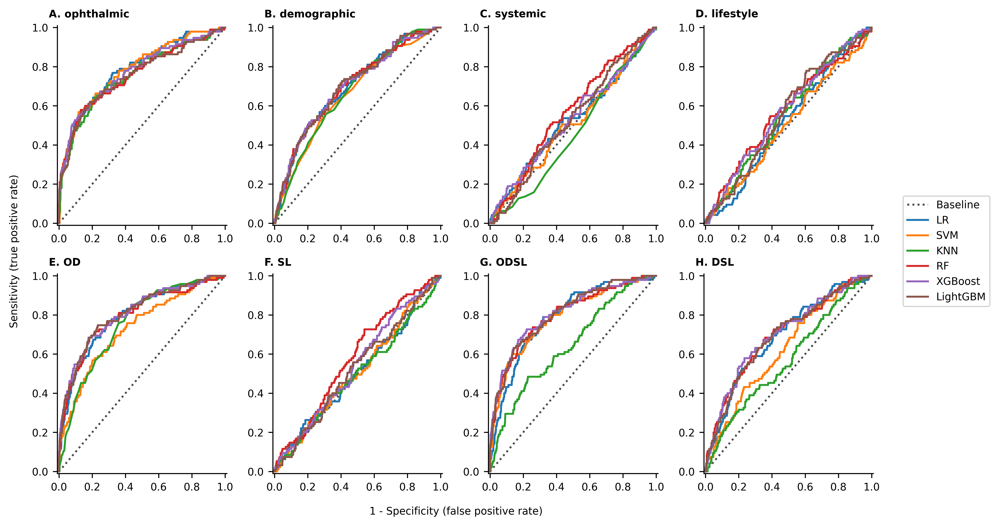

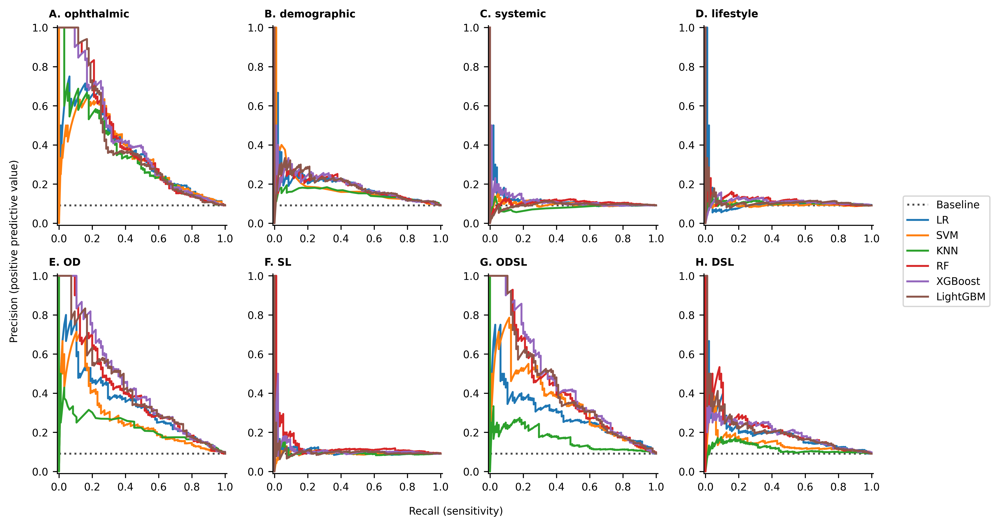

In [10]:
auroc_bar_fig, auroc_bar_axes = plt.subplots(4, 2, figsize=(35/2.54, 23/2.54), dpi=600, sharex=False, sharey=True)
roc_fig, roc_axes = plt.subplots(2, 4, figsize=(24/2.54, 14/2.54), dpi=600, sharex=False, sharey=False)
prc_fig, prc_axes = plt.subplots(2, 4, figsize=(24/2.54, 14/2.54), dpi=600, sharex=False, sharey=False)

auroc_bar_axes = auroc_bar_axes.flatten()
roc_axes = roc_axes.flatten()
prc_axes = prc_axes.flatten()

title_arr = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K']
#title_arr = ['i', 'ii', 'iii', 'iv', 'v', 'vi', 'vii', 'viii', 'ix', 'x']

for i, (feature_set_name, features) in zip(range(len(compare_feature_set_dict.items())), compare_feature_set_dict.items()):
    print(feature_set_name)
    
    subplot_title = title_arr[i]
    auroc_bar_ax = auroc_bar_axes[i]
    roc_ax = roc_axes[i]
    prc_ax = prc_axes[i]

    feature_set_dict = {}
    for display_name, algorithm in algorithm_display_names_matched5year_tte.items():
        feature_set_dict[display_name] = {
            'feature_set': feature_set_name,
            'save_dir': f'./{fitted_models_dir}/{feature_set_name}/{algorithm}',
            'algorithm': algorithm,
        }

    compare_models(
        feature_set_dict, f'./evaluation/{feature_set_name}',
        #X_test_imputed_scaled_matched5year_tte,
        #y_test_matched5year_tte,
        auroc_bar_ax=auroc_bar_ax, 
        roc_ax=roc_ax, 
        prc_ax=prc_ax,
    )
    
    auroc_bar_ax.text(-0.05, 1.03, f'{subplot_title}. {feature_set_name}', transform=auroc_bar_ax.transAxes, fontsize=8, fontweight='bold', va='bottom', ha='left')
    auroc_bar_ax.tick_params(axis='x', labelsize=8)
    auroc_bar_ax.tick_params(axis='y', labelsize=8)
    auroc_bar_ax.set_yticks(np.linspace(0, 1, 6))

    auroc_bar_ax.spines['top'].set_visible(False)
    auroc_bar_ax.spines['right'].set_visible(False)
    #auroc_bar_ax.spines['left'].set_visible(False)

    roc_ax.text(-0.05, 1.03, f'{subplot_title}. {feature_set_name}', transform=roc_ax.transAxes, fontsize=8, fontweight='bold', va='bottom', ha='left')
    roc_ax.tick_params(axis='x', labelsize=8)
    roc_ax.tick_params(axis='y', labelsize=8)
    roc_ax.set_xticks(np.linspace(0, 1, 6))
    roc_ax.set_yticks(np.linspace(0, 1, 6))
    roc_ax.spines['top'].set_visible(False)
    roc_ax.spines['right'].set_visible(False)

    prc_ax.text(-0.05, 1.03, f'{subplot_title}. {feature_set_name}', transform=prc_ax.transAxes, fontsize=8, fontweight='bold', va='bottom', ha='left')
    prc_ax.tick_params(axis='x', labelsize=8)
    prc_ax.tick_params(axis='y', labelsize=8)
    prc_ax.set_xticks(np.linspace(0, 1, 6))
    prc_ax.set_yticks(np.linspace(0, 1, 6))
    prc_ax.spines['top'].set_visible(False)
    prc_ax.spines['right'].set_visible(False)




# AUROC Bar
#auroc_bar_fig.yticks(np.linspace(0, 1, 6))
#auroc_bar_fig.tick_params(axis='y', labelsize=8)

legend_labels = ['Baseline (0.500)'] + list(algorithm_display_names_matched5year_tte.keys())

auroc_bar_fig.text(0.5, -0.01, 'Algorithm', ha='center', va='center', fontsize=8)
auroc_bar_fig.text(-0.01, 0.5, 'AUROC', ha='left', va='center', rotation='vertical', fontsize=8)
auroc_bar_fig.legend(loc='center', bbox_to_anchor=(1.01, 0, 0.1, 1), fontsize=8, labels=legend_labels, handles=roc_axes[0].lines)
auroc_bar_fig.tight_layout()
auroc_bar_fig.savefig(f'./evaluation/compare_feature_sets_auroc_bar_matched5year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
auroc_bar_fig.show()


# ROC
legend_labels = ['Baseline'] + list(algorithm_display_names_matched5year_tte.keys())

roc_fig.text(0.5, -0.01, '1 - Specificity (false positive rate)', ha='center', va='center', fontsize=8)
roc_fig.text(-0.01, 0.5, 'Sensitivity (true positive rate)', ha='left', va='center', rotation='vertical', fontsize=8)
roc_fig.legend(loc='center', bbox_to_anchor=(1.01, 0, 0.1, 1), fontsize=8, labels=legend_labels, handles=roc_axes[0].lines)
roc_fig.tight_layout()
roc_fig.savefig(f'./evaluation/compare_feature_sets_roc_matched5year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
roc_fig.show()

# PRC
prc_fig.text(0.5, -0.01, 'Recall (sensitivity)', ha='center', va='center', fontsize=8)
prc_fig.text(-0.01, 0.5, 'Precision (positive predictive value)', ha='left', va='center', rotation='vertical', fontsize=8)
prc_fig.legend(loc='center', bbox_to_anchor=(1.01, 0, 0.1, 1), fontsize=8, labels=legend_labels, handles=roc_axes[0].lines)
prc_fig.tight_layout()
prc_fig.savefig(f'./evaluation/compare_feature_sets_prc_matched5year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
prc_fig.show()

<br>

## IOP removed 5 years

In [6]:
removed_features = ['IOPg pre-treatment', 'IOPg pre-treatment inter-eye difference', 
                    'Corneal hysteresis inter-eye difference', 
                    'Spherical equivalent', 'Corneal resistance factor', 
                    'Speech reception threshold', 'Corneal hysteresis',
                    'Tinnitus frequency (self-reported)', 'Arterial stiffness index', 'Private healthcare utilisation', 
                    'Exercise (summed MET minutes per week)', 'Total household income']

# this removes all 'opthalmic' features
model_feature_dict = compare_feature_set_dict = {
    #'ophthalmic': feature_sets.ophthalmic_features['feature'].values[~np.isin(feature_sets.ophthalmic_features['feature'].values, removed_features)],
    'demographic': feature_sets.demographic_features['feature'].values[~np.isin(feature_sets.demographic_features['feature'].values, removed_features)],
    'systemic': feature_sets.systemic_features['feature'].values[~np.isin(feature_sets.systemic_features['feature'].values, removed_features)],
    'lifestyle': feature_sets.lifestyle_features['feature'].values[~np.isin(feature_sets.lifestyle_features['feature'].values, removed_features)],

    #'OD': feature_sets.OD_features['feature'].values[~np.isin(feature_sets.OD_features['feature'].values, removed_features)],
    'SL': feature_sets.SL_features['feature'].values[~np.isin(feature_sets.SL_features['feature'].values, removed_features)],
    #'ODSL': feature_sets.ODSL_features['feature'].values[~np.isin(feature_sets.ODSL_features['feature'].values, removed_features)],
    'DSL': feature_sets.DSL_features['feature'].values[~np.isin(feature_sets.DSL_features['feature'].values, removed_features)],
    'DS': feature_sets.DS_features['feature'].values[~np.isin(feature_sets.DS_features['feature'].values, removed_features)],
    'DL': feature_sets.DL_features['feature'].values[~np.isin(feature_sets.DL_features['feature'].values, removed_features)]}


In [10]:
def compare_models(model_dict, save_dir=None, auroc_bar_ax=None, roc_ax=None, prc_ax=None):
    model_df = pd.DataFrame(columns=['Model'])
    model_df = model_df.set_index('Model', drop=True)

    estimator_dict = {}

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)

    for model_name, model_properties in model_dict.items():
        print(model_name)

        feature_set = model_feature_dict[model_properties['feature_set']]
        X = X_test_imputed_scaled_IOPremoved5year_tte[feature_set]

        estimator = load(f'{model_properties['save_dir']}.pkl')
        with open(f'{model_properties['save_dir']}_best_params.txt', 'r') as txt:
            params = txt.read()
        
        test_scoring_metrics = get_scoring_metrics(estimator, X, y_test_IOPremoved5year_tte)
        probabilities = get_estimator_probabilities(estimator, X)
        auroc = test_scoring_metrics['roc_auc']
        auprc = test_scoring_metrics['pr_auc']

        t = model_util.get_ideal_threshold(y_test_IOPremoved5year_tte, probabilities)

        btstrp_measures = model_util.get_bootstrapped_measures(y_test_IOPremoved5year_tte, probabilities, t).confidence_interval
        auroc_CI_low, auprc_CI_low, sensitivity_CI_low, specificity_CI_low, ppv_CI_low, npv_CI_low, f1_CI_low = btstrp_measures.low
        auroc_CI_high, auprc_CI_high, sensitivity_CI_high, specificity_CI_high, ppv_CI_high, npv_CI_high, f1_CI_high = btstrp_measures.high

        model_df.loc[model_name, 'Algorithm'] = model_properties['algorithm']
        model_df.loc[model_name, 'Parameters'] = params
        model_df.loc[model_name, 'AUROC'] = auroc
        model_df.loc[model_name, 'AUROC (95% CI)'] = f'{auroc:0.3f} ({auroc_CI_low:0.3f} - {auroc_CI_high:0.3f})'
       
        model_df.loc[model_name, 'Sensitivity (95% CI)'] = (
            f'{test_scoring_metrics['sensitivity_recall']:0.3f} '
            f'({sensitivity_CI_low:0.3f} - {sensitivity_CI_high:0.3f})'
        )
        
        model_df.loc[model_name, 'Specificity (95% CI)'] = (
            f'{test_scoring_metrics['specificity']:0.3f} '
            f'({specificity_CI_low:0.3f} - {specificity_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'PPV (95% CI)'] = (
            f'{test_scoring_metrics['ppv_precision']:0.3f} '
            f'({ppv_CI_low:0.3f} - {ppv_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'NPV (95% CI)'] = (
            f'{test_scoring_metrics['npv']:0.3f} '
            f'({npv_CI_low:0.3f} - {npv_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'F1 score (95% CI)'] = (
            f'{test_scoring_metrics['f1_score']:0.3f} '
            f'({f1_CI_low:0.3f} - {f1_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'AUPRC (95% CI)'] = (
            f'{auprc:0.3f} '
            f'({auprc_CI_low:0.3f} - {auprc_CI_high:0.3f})'
        )

        estimator_dict[model_name] = {
            'estimator': estimator,
            'model_name': model_name,
            'X': X,
            'probabilities': probabilities,
            'roc_label': f'{model_name}: {auroc:0.3f} ({auroc_CI_low:0.3f} - {auroc_CI_high:0.3f})',
            'prc_label': f'{model_name}: {auprc:0.3f} ({auprc_CI_low:0.3f} - {auprc_CI_high:0.3f})',

            'auroc': auroc,
            'auroc_CI_low': auroc_CI_low,
            'auroc_CI_high': auroc_CI_high,

            'auprc': auprc,
            'auprc_CI_low': auprc_CI_low,
            'auprc_CI_high': auprc_CI_high,

            'f1_score': test_scoring_metrics['f1_score'],
            'f1_CI_low': f1_CI_low,
            'f1_CI_high': f1_CI_high,
            
            'sensitivity_recall': test_scoring_metrics['sensitivity_recall'],
            'sensitivity_CI_low': sensitivity_CI_low,
            'sensitivity_CI_high': sensitivity_CI_high,
            
            'specificity': test_scoring_metrics['specificity'],
            'specificity_CI_low': specificity_CI_low,
            'specificity_CI_high': specificity_CI_high,
        }

    best_model = model_df['AUROC'].idxmax()
    best_model_dict = model_dict[best_model]
    best_model_algorithm = best_model_dict['algorithm']
    print(f'Best model: {best_model} ({best_model_algorithm})')

    if auroc_bar_ax != None:
        compare_estimator_auroc_bar(estimator_dict, y_test_IOPremoved5year_tte, best_model=best_model, ax=auroc_bar_ax)
    compare_estimator_roc(estimator_dict, y_test_IOPremoved5year_tte, ax=roc_ax)
    compare_estimator_prc(estimator_dict, y_test_IOPremoved5year_tte, ax=prc_ax)


    display(model_df.style.set_properties(**{
        'white-space': 'pre-wrap',
    }))

    if save_dir:
        model_df.to_csv(f'{save_dir}/comparison_results_IOPremoved5year_tte.tsv', sep='\t')
        # Save best model as txt
        with open(f'{save_dir}/best_model_IOPremoved5year_tte.txt', 'w+') as txt:
            txt.write(best_model)
        with open(f'{save_dir}/best_algorithm_IOPremoved5year_tte.txt', 'w+') as txt:
            txt.write(best_model_algorithm)

   # plt.show()

demographic
LR
SVM
KNN
RF
XGBoost


/home/eake191/.pyenv/versions/3.13.2/lib/python3.13/site-packages/xgboost/core.py:158: UserWarning: [09:55:00] WARNING: /workspace/src/collective/../data/../common/error_msg.h:80: If you are loading a serialized model (like pickle in Python, RDS in R) or
configuration generated by an older version of XGBoost, please export the model by calling
`Booster.save_model` from that version first, then load it back in current version. See:

    https://xgboost.readthedocs.io/en/stable/tutorials/saving_model.html

for more details about differences between saving model and serializing.

  warnings.warn(smsg, UserWarning)


LightGBM
Best model: LightGBM (lightgbm_IOPremoved5year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_IOPremoved5year_tte,alpha: 8.457884030535228e-06 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.734693,0.735 (0.712 - 0.757),0.670 (0.628 - 0.712),0.695 (0.692 - 0.698),0.011 (0.009 - 0.012),0.998 (0.997 - 0.998),0.021 (0.019 - 0.023),0.022 (0.014 - 0.032)
SVM,svm_IOPremoved5year_tte,C: 0.02132459118855662 kernel: rbf gamma: 3.172800914483943e-06 random_state: 2024 cache_size: 7000 max_iter: 1000,0.677512,0.678 (0.654 - 0.701),0.744 (0.704 - 0.782),0.512 (0.509 - 0.515),0.007 (0.007 - 0.008),0.998 (0.997 - 0.998),0.015 (0.013 - 0.016),0.014 (0.010 - 0.022)
KNN,knn_IOPremoved5year_tte,n_neighbors: 499 weights: uniform metric: euclidean algorithm: brute,0.690846,0.691 (0.667 - 0.715),0.630 (0.587 - 0.673),0.672 (0.669 - 0.675),0.009 (0.008 - 0.010),0.997 (0.997 - 0.998),0.018 (0.016 - 0.020),0.016 (0.012 - 0.021)
RF,randomforest_IOPremoved5year_tte,n_estimators: 167 max_depth: 50 max_features: 0.4618110083298674 min_samples_leaf: 1646 max_samples: 0.8531198894903639 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.733414,0.733 (0.711 - 0.755),0.679 (0.636 - 0.720),0.683 (0.680 - 0.686),0.010 (0.009 - 0.011),0.998 (0.997 - 0.998),0.020 (0.018 - 0.023),0.019 (0.015 - 0.027)
XGBoost,xgboost_IOPremoved5year_tte,n_estimators: 396 learning_rate: 0.014473110624415563 max_depth: 3 subsample: 0.6130549358448498 colsample_bytree: 0.6851975671681233 gamma: 0.0006894455907267509 lambda: 0.035966272858541135 min_child_weight: 0.0004353902551661734 max_bin: 887 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.736703,0.737 (0.715 - 0.758),0.683 (0.641 - 0.724),0.675 (0.672 - 0.678),0.010 (0.009 - 0.011),0.998 (0.997 - 0.998),0.020 (0.018 - 0.022),0.024 (0.016 - 0.037)
LightGBM,lightgbm_IOPremoved5year_tte,n_estimators: 484 max_bin: 379 learning_rate: 0.06843298876998485 max_depth: 3 num_leaves: 47 bagging_fraction: 0.5704024368605193 feature_fraction: 0.7319047737033968 lambda_l2: 538.3704067639081 min_sum_hessian_in_leaf: 0.3673707488401159 min_data_in_leaf: 2341 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.736937,0.737 (0.715 - 0.759),0.718 (0.678 - 0.759),0.640 (0.637 - 0.643),0.010 (0.009 - 0.011),0.998 (0.997 - 0.998),0.019 (0.017 - 0.021),0.020 (0.015 - 0.028)


systemic
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: XGBoost (xgboost_IOPremoved5year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_IOPremoved5year_tte,alpha: 1.0405565824537065e-06 learning_rate: adaptive eta0: 0.0996829125715576 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.626137,0.626 (0.602 - 0.650),0.624 (0.580 - 0.667),0.577 (0.573 - 0.580),0.007 (0.006 - 0.008),0.997 (0.996 - 0.997),0.014 (0.013 - 0.016),0.007 (0.006 - 0.009)
SVM,svm_IOPremoved5year_tte,C: 0.004013093081633651 kernel: rbf gamma: 1.6618460650698947 random_state: 2024 cache_size: 7000 max_iter: 1000,0.562255,0.562 (0.537 - 0.589),0.519 (0.474 - 0.564),0.584 (0.581 - 0.587),0.006 (0.005 - 0.007),0.996 (0.995 - 0.996),0.012 (0.011 - 0.013),0.006 (0.005 - 0.007)
KNN,knn_IOPremoved5year_tte,n_neighbors: 443 weights: uniform metric: cosine algorithm: brute,0.566912,0.567 (0.541 - 0.593),0.452 (0.407 - 0.497),0.662 (0.659 - 0.665),0.007 (0.006 - 0.007),0.996 (0.995 - 0.996),0.013 (0.011 - 0.015),0.007 (0.006 - 0.008)
RF,randomforest_IOPremoved5year_tte,n_estimators: 397 max_depth: 12 max_features: 0.09734706039944349 min_samples_leaf: 452 max_samples: 0.9579068073104681 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.622575,0.623 (0.598 - 0.647),0.626 (0.583 - 0.669),0.568 (0.565 - 0.571),0.007 (0.006 - 0.008),0.997 (0.996 - 0.997),0.014 (0.012 - 0.015),0.007 (0.006 - 0.009)
XGBoost,xgboost_IOPremoved5year_tte,n_estimators: 499 learning_rate: 0.009208276804289199 max_depth: 4 subsample: 0.8064350092881037 colsample_bytree: 0.5224138214857529 gamma: 0.6840883287086624 lambda: 0.0031208003211151782 min_child_weight: 0.013169457411422433 max_bin: 362 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.627332,0.627 (0.603 - 0.652),0.649 (0.606 - 0.692),0.549 (0.546 - 0.552),0.007 (0.006 - 0.008),0.997 (0.996 - 0.997),0.014 (0.012 - 0.015),0.008 (0.007 - 0.009)
LightGBM,lightgbm_IOPremoved5year_tte,n_estimators: 484 max_bin: 416 learning_rate: 0.011328394200017473 max_depth: 4 num_leaves: 113 bagging_fraction: 0.5160385435470443 feature_fraction: 0.9286645513893144 lambda_l2: 0.0013033678065761875 min_sum_hessian_in_leaf: 0.00024917021042282077 min_data_in_leaf: 4064 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.626806,0.627 (0.603 - 0.651),0.645 (0.603 - 0.688),0.559 (0.556 - 0.562),0.007 (0.006 - 0.008),0.997 (0.996 - 0.997),0.014 (0.013 - 0.016),0.007 (0.006 - 0.009)


lifestyle
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: LR (logistic_regression_sgd_IOPremoved5year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_IOPremoved5year_tte,alpha: 2.5886478835336378e-05 learning_rate: constant eta0: 0.014028816646027925 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.538409,0.538 (0.512 - 0.564),0.565 (0.520 - 0.611),0.515 (0.512 - 0.518),0.006 (0.005 - 0.006),0.996 (0.995 - 0.996),0.011 (0.010 - 0.013),0.005 (0.005 - 0.006)
SVM,svm_IOPremoved5year_tte,C: 7.375568395093422 kernel: linear random_state: 2024 cache_size: 7000 max_iter: 1000,0.501112,0.501 (0.475 - 0.528),0.435 (0.391 - 0.480),0.598 (0.595 - 0.602),0.005 (0.005 - 0.006),0.995 (0.995 - 0.996),0.010 (0.009 - 0.012),0.005 (0.004 - 0.006)
KNN,knn_IOPremoved5year_tte,n_neighbors: 229 weights: uniform metric: cosine algorithm: brute,0.520498,0.520 (0.494 - 0.546),0.351 (0.307 - 0.394),0.696 (0.693 - 0.699),0.006 (0.005 - 0.006),0.995 (0.995 - 0.996),0.011 (0.009 - 0.013),0.005 (0.005 - 0.006)
RF,randomforest_IOPremoved5year_tte,n_estimators: 191 max_depth: 26 max_features: 0.06422573810471699 min_samples_leaf: 2685 max_samples: 0.8832347375513229 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.537639,0.538 (0.512 - 0.564),0.756 (0.717 - 0.795),0.317 (0.314 - 0.320),0.005 (0.005 - 0.006),0.996 (0.996 - 0.997),0.011 (0.010 - 0.012),0.006 (0.005 - 0.007)
XGBoost,xgboost_IOPremoved5year_tte,n_estimators: 233 learning_rate: 0.0321238934668311 max_depth: 3 subsample: 0.5138592839911925 colsample_bytree: 0.5016302371277843 gamma: 0.08975411316857689 lambda: 0.1459353666785252 min_child_weight: 0.0005235970779547082 max_bin: 495 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.528738,0.529 (0.503 - 0.555),0.391 (0.348 - 0.435),0.667 (0.664 - 0.670),0.006 (0.005 - 0.007),0.996 (0.995 - 0.996),0.011 (0.010 - 0.013),0.005 (0.005 - 0.006)
LightGBM,lightgbm_IOPremoved5year_tte,n_estimators: 185 max_bin: 296 learning_rate: 0.0035586283291001255 max_depth: 10 num_leaves: 8 bagging_fraction: 0.6248459454891753 feature_fraction: 0.5218135811216726 lambda_l2: 0.06479432178014047 min_sum_hessian_in_leaf: 0.0002214524985057431 min_data_in_leaf: 4542 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.530347,0.530 (0.505 - 0.556),0.447 (0.403 - 0.493),0.618 (0.615 - 0.621),0.006 (0.005 - 0.006),0.996 (0.995 - 0.996),0.011 (0.010 - 0.013),0.005 (0.005 - 0.006)


SL
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: XGBoost (xgboost_IOPremoved5year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_IOPremoved5year_tte,alpha: 1.0369235103887628e-06 learning_rate: adaptive eta0: 0.09857966071803546 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.628533,0.629 (0.604 - 0.652),0.756 (0.718 - 0.794),0.445 (0.442 - 0.449),0.007 (0.006 - 0.007),0.997 (0.997 - 0.998),0.013 (0.012 - 0.014),0.007 (0.006 - 0.009)
SVM,svm_IOPremoved5year_tte,C: 0.0009326334233196188 kernel: rbf gamma: 0.5904316705978044 random_state: 2024 cache_size: 7000 max_iter: 1000,0.543038,0.543 (0.517 - 0.570),0.403 (0.360 - 0.448),0.685 (0.682 - 0.688),0.006 (0.005 - 0.007),0.996 (0.995 - 0.996),0.012 (0.011 - 0.014),0.006 (0.005 - 0.007)
KNN,knn_IOPremoved5year_tte,n_neighbors: 483 weights: distance metric: cosine algorithm: brute,0.535137,0.535 (0.508 - 0.562),0.321 (0.279 - 0.364),0.744 (0.741 - 0.747),0.006 (0.005 - 0.007),0.996 (0.995 - 0.996),0.012 (0.010 - 0.014),0.006 (0.005 - 0.007)
RF,randomforest_IOPremoved5year_tte,n_estimators: 500 max_depth: 14 max_features: 0.09696455396757331 min_samples_leaf: 853 max_samples: 0.9022773286034558 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.623747,0.624 (0.599 - 0.648),0.655 (0.613 - 0.698),0.547 (0.544 - 0.550),0.007 (0.006 - 0.008),0.997 (0.996 - 0.997),0.014 (0.012 - 0.015),0.008 (0.007 - 0.009)
XGBoost,xgboost_IOPremoved5year_tte,n_estimators: 460 learning_rate: 0.01751148238928499 max_depth: 3 subsample: 0.5422536486679724 colsample_bytree: 0.9064467611451054 gamma: 0.034038414612606836 lambda: 1.015053619815034 min_child_weight: 6.733807611672213 max_bin: 805 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.634389,0.634 (0.609 - 0.659),0.632 (0.589 - 0.677),0.587 (0.583 - 0.590),0.007 (0.007 - 0.008),0.997 (0.996 - 0.997),0.015 (0.013 - 0.016),0.008 (0.007 - 0.012)
LightGBM,lightgbm_IOPremoved5year_tte,n_estimators: 344 max_bin: 425 learning_rate: 0.02951569025254197 max_depth: 3 num_leaves: 90 bagging_fraction: 0.5199349046196241 feature_fraction: 0.7259699335563232 lambda_l2: 1.806708028351317 min_sum_hessian_in_leaf: 0.9235144084445832 min_data_in_leaf: 1225 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.633919,0.634 (0.610 - 0.659),0.555 (0.510 - 0.599),0.652 (0.649 - 0.655),0.008 (0.007 - 0.009),0.997 (0.996 - 0.997),0.015 (0.014 - 0.017),0.009 (0.007 - 0.014)


DSL
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: LR (logistic_regression_sgd_IOPremoved5year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_IOPremoved5year_tte,alpha: 6.263107463505277e-06 learning_rate: adaptive eta0: 0.0684743631377439 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.749222,0.749 (0.727 - 0.770),0.725 (0.685 - 0.764),0.652 (0.649 - 0.655),0.010 (0.009 - 0.011),0.998 (0.998 - 0.998),0.020 (0.018 - 0.022),0.021 (0.015 - 0.031)
SVM,svm_IOPremoved5year_tte,C: 6.070813594349721e-06 kernel: rbf gamma: 0.48999068106789323 random_state: 2024 cache_size: 7000 max_iter: 1000,0.577986,0.578 (0.553 - 0.604),0.429 (0.384 - 0.473),0.690 (0.687 - 0.693),0.007 (0.006 - 0.008),0.996 (0.995 - 0.996),0.013 (0.011 - 0.015),0.007 (0.006 - 0.011)
KNN,knn_IOPremoved5year_tte,n_neighbors: 499 weights: distance metric: manhattan algorithm: brute,0.598411,0.598 (0.574 - 0.623),0.737 (0.697 - 0.777),0.421 (0.418 - 0.424),0.006 (0.006 - 0.007),0.997 (0.996 - 0.997),0.012 (0.011 - 0.014),0.007 (0.006 - 0.008)
RF,randomforest_IOPremoved5year_tte,n_estimators: 466 max_depth: 46 max_features: 0.4913100196056107 min_samples_leaf: 877 max_samples: 0.9878678557032239 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.732576,0.733 (0.709 - 0.755),0.592 (0.549 - 0.636),0.758 (0.756 - 0.761),0.012 (0.011 - 0.013),0.997 (0.997 - 0.998),0.023 (0.021 - 0.026),0.019 (0.015 - 0.025)
XGBoost,xgboost_IOPremoved5year_tte,n_estimators: 453 learning_rate: 0.012311055731749851 max_depth: 3 subsample: 0.5092762113653533 colsample_bytree: 0.7709911467572585 gamma: 0.8431908659080872 lambda: 1.2865597195941214 min_child_weight: 0.0008925817737411303 max_bin: 274 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.743238,0.743 (0.721 - 0.765),0.731 (0.691 - 0.771),0.628 (0.625 - 0.631),0.010 (0.009 - 0.011),0.998 (0.998 - 0.998),0.019 (0.017 - 0.021),0.020 (0.015 - 0.026)
LightGBM,lightgbm_IOPremoved5year_tte,n_estimators: 383 max_bin: 648 learning_rate: 0.01750506837471075 max_depth: 3 num_leaves: 36 bagging_fraction: 0.59719172574802 feature_fraction: 0.6092883523474008 lambda_l2: 0.039276913698989106 min_sum_hessian_in_leaf: 0.09217834313394564 min_data_in_leaf: 2087 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.742757,0.743 (0.720 - 0.765),0.727 (0.687 - 0.766),0.637 (0.634 - 0.640),0.010 (0.009 - 0.011),0.998 (0.998 - 0.998),0.019 (0.017 - 0.021),0.021 (0.016 - 0.031)


DS
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: LR (logistic_regression_sgd_IOPremoved5year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_IOPremoved5year_tte,alpha: 1.4957693820363246e-05 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.746858,0.747 (0.725 - 0.768),0.580 (0.535 - 0.624),0.794 (0.791 - 0.796),0.014 (0.012 - 0.015),0.997 (0.997 - 0.998),0.027 (0.024 - 0.030),0.020 (0.015 - 0.030)
SVM,svm_IOPremoved5year_tte,C: 0.5743423210722213 kernel: rbf gamma: 0.8875133837108571 random_state: 2024 cache_size: 7000 max_iter: 1000,0.579027,0.579 (0.554 - 0.604),0.601 (0.556 - 0.645),0.526 (0.523 - 0.529),0.006 (0.005 - 0.007),0.996 (0.996 - 0.997),0.012 (0.011 - 0.014),0.006 (0.006 - 0.007)
KNN,knn_IOPremoved5year_tte,n_neighbors: 499 weights: distance metric: manhattan algorithm: brute,0.627488,0.627 (0.602 - 0.653),0.565 (0.520 - 0.610),0.638 (0.635 - 0.641),0.008 (0.007 - 0.008),0.997 (0.996 - 0.997),0.015 (0.013 - 0.017),0.009 (0.007 - 0.012)
RF,randomforest_IOPremoved5year_tte,n_estimators: 484 max_depth: 7 max_features: 0.6197182185296937 min_samples_leaf: 352 max_samples: 0.9495281538780727 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.732896,0.733 (0.710 - 0.755),0.683 (0.641 - 0.724),0.662 (0.659 - 0.665),0.010 (0.009 - 0.011),0.998 (0.997 - 0.998),0.019 (0.017 - 0.021),0.022 (0.015 - 0.032)
XGBoost,xgboost_IOPremoved5year_tte,n_estimators: 456 learning_rate: 0.013194828224773279 max_depth: 3 subsample: 0.516910830845163 colsample_bytree: 0.7601044119888964 gamma: 0.002640406711358234 lambda: 0.034437431967535743 min_child_weight: 9.420105990282467 max_bin: 682 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.742758,0.743 (0.720 - 0.764),0.689 (0.648 - 0.731),0.668 (0.665 - 0.671),0.010 (0.009 - 0.011),0.998 (0.997 - 0.998),0.020 (0.018 - 0.022),0.020 (0.015 - 0.027)
LightGBM,lightgbm_IOPremoved5year_tte,n_estimators: 446 max_bin: 567 learning_rate: 0.01840575864585838 max_depth: 3 num_leaves: 69 bagging_fraction: 0.755643594056759 feature_fraction: 0.6807546320896711 lambda_l2: 1.2752541166411915 min_sum_hessian_in_leaf: 0.015885158447613932 min_data_in_leaf: 2302 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.742901,0.743 (0.721 - 0.765),0.649 (0.606 - 0.692),0.711 (0.708 - 0.713),0.011 (0.010 - 0.012),0.998 (0.997 - 0.998),0.021 (0.019 - 0.024),0.022 (0.016 - 0.032)


DL
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: LR (logistic_regression_sgd_IOPremoved5year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_IOPremoved5year_tte,alpha: 1.3696074306983683e-06 learning_rate: adaptive eta0: 0.05920462720521134 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.740875,0.741 (0.719 - 0.763),0.639 (0.595 - 0.681),0.728 (0.725 - 0.730),0.011 (0.010 - 0.013),0.998 (0.997 - 0.998),0.022 (0.020 - 0.025),0.025 (0.017 - 0.038)
SVM,svm_IOPremoved5year_tte,C: 0.5884281212718594 kernel: poly gamma: 2.1052479705477503e-06 degree: 3 random_state: 2024 cache_size: 7000 max_iter: 1000,0.591169,0.591 (0.565 - 0.616),0.443 (0.400 - 0.487),0.707 (0.704 - 0.709),0.007 (0.006 - 0.008),0.996 (0.996 - 0.997),0.014 (0.013 - 0.016),0.009 (0.006 - 0.015)
KNN,knn_IOPremoved5year_tte,n_neighbors: 497 weights: distance metric: manhattan algorithm: brute,0.611341,0.611 (0.585 - 0.637),0.611 (0.567 - 0.656),0.566 (0.563 - 0.569),0.007 (0.006 - 0.008),0.997 (0.996 - 0.997),0.014 (0.012 - 0.015),0.009 (0.007 - 0.015)
RF,randomforest_IOPremoved5year_tte,n_estimators: 470 max_depth: 14 max_features: 0.46280124823093344 min_samples_leaf: 1320 max_samples: 0.7719636133692748 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.731039,0.731 (0.708 - 0.754),0.748 (0.709 - 0.787),0.608 (0.605 - 0.611),0.009 (0.008 - 0.010),0.998 (0.998 - 0.998),0.018 (0.016 - 0.020),0.021 (0.015 - 0.030)
XGBoost,xgboost_IOPremoved5year_tte,n_estimators: 318 learning_rate: 0.016908717450645542 max_depth: 3 subsample: 0.5108771392101795 colsample_bytree: 0.7360761445813689 gamma: 0.09531726107636272 lambda: 1.8139515485635536 min_child_weight: 0.0005511225667504394 max_bin: 640 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.739191,0.739 (0.716 - 0.761),0.704 (0.662 - 0.745),0.665 (0.662 - 0.668),0.010 (0.009 - 0.011),0.998 (0.997 - 0.998),0.020 (0.018 - 0.022),0.024 (0.016 - 0.037)
LightGBM,lightgbm_IOPremoved5year_tte,n_estimators: 401 max_bin: 383 learning_rate: 0.01392298503853622 max_depth: 3 num_leaves: 79 bagging_fraction: 0.5210229483549677 feature_fraction: 0.6232668019443394 lambda_l2: 3.874376705206355 min_sum_hessian_in_leaf: 0.10500495351426811 min_data_in_leaf: 1476 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.738679,0.739 (0.716 - 0.761),0.676 (0.634 - 0.718),0.687 (0.684 - 0.690),0.010 (0.009 - 0.012),0.998 (0.997 - 0.998),0.021 (0.018 - 0.023),0.022 (0.016 - 0.034)


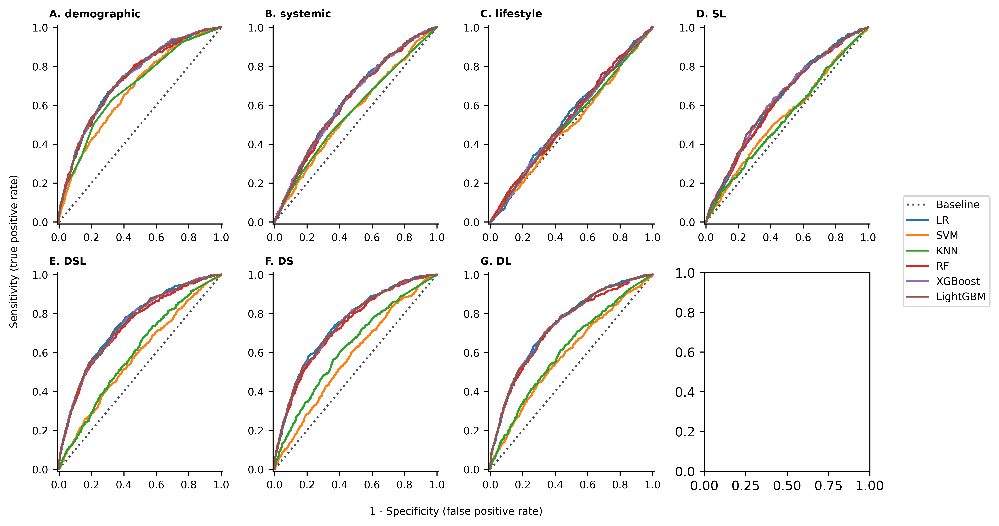

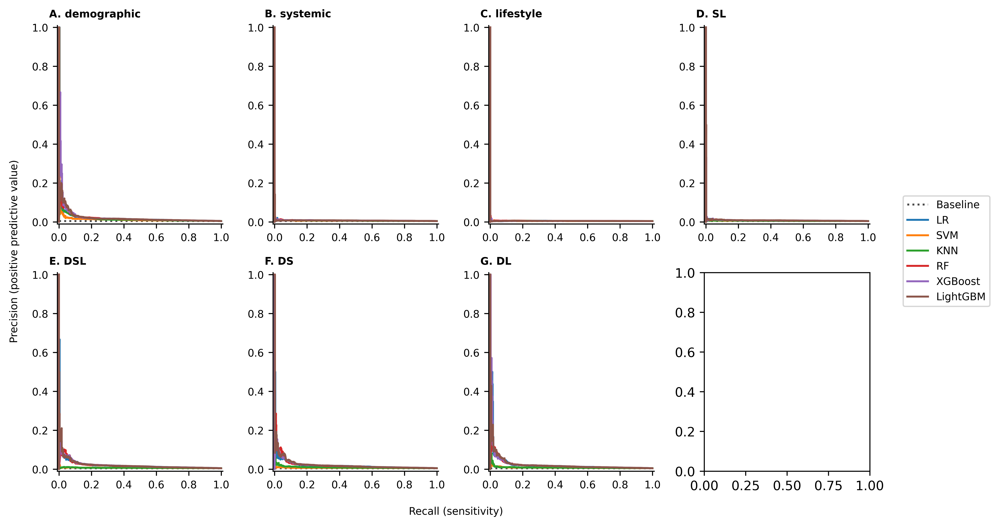

In [11]:
auroc_bar_fig, auroc_bar_axes = plt.subplots(4, 2, figsize=(35/2.54, 23/2.54), dpi=600, sharex=False, sharey=True)
roc_fig, roc_axes = plt.subplots(2, 4, figsize=(24/2.54, 14/2.54), dpi=600, sharex=False, sharey=False)
prc_fig, prc_axes = plt.subplots(2, 4, figsize=(24/2.54, 14/2.54), dpi=600, sharex=False, sharey=False)

auroc_bar_axes = auroc_bar_axes.flatten()
roc_axes = roc_axes.flatten()
prc_axes = prc_axes.flatten()

title_arr = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K']
#title_arr = ['i', 'ii', 'iii', 'iv', 'v', 'vi', 'vii', 'viii', 'ix', 'x']

for i, (feature_set_name, features) in zip(range(len(compare_feature_set_dict.items())), compare_feature_set_dict.items()):
    print(feature_set_name)
    
    subplot_title = title_arr[i]
    auroc_bar_ax = auroc_bar_axes[i]
    roc_ax = roc_axes[i]
    prc_ax = prc_axes[i]

    feature_set_dict = {}
    for display_name, algorithm in algorithm_display_names_IOPremoved5year_tte.items():
        feature_set_dict[display_name] = {
            'feature_set': feature_set_name,
            'save_dir': f'./{fitted_models_dir}/{feature_set_name}/{algorithm}',
            'algorithm': algorithm,
        }

    compare_models(
        feature_set_dict, f'./evaluation/{feature_set_name}',
        #X_test_imputed_scaled_IOPremoved5year_tte,
        #y_test_IOPremoved5year_tte,
        auroc_bar_ax=auroc_bar_ax, 
        roc_ax=roc_ax, 
        prc_ax=prc_ax,
    )
    
    auroc_bar_ax.text(-0.05, 1.03, f'{subplot_title}. {feature_set_name}', transform=auroc_bar_ax.transAxes, fontsize=8, fontweight='bold', va='bottom', ha='left')
    auroc_bar_ax.tick_params(axis='x', labelsize=8)
    auroc_bar_ax.tick_params(axis='y', labelsize=8)
    auroc_bar_ax.set_yticks(np.linspace(0, 1, 6))

    auroc_bar_ax.spines['top'].set_visible(False)
    auroc_bar_ax.spines['right'].set_visible(False)
    #auroc_bar_ax.spines['left'].set_visible(False)

    roc_ax.text(-0.05, 1.03, f'{subplot_title}. {feature_set_name}', transform=roc_ax.transAxes, fontsize=8, fontweight='bold', va='bottom', ha='left')
    roc_ax.tick_params(axis='x', labelsize=8)
    roc_ax.tick_params(axis='y', labelsize=8)
    roc_ax.set_xticks(np.linspace(0, 1, 6))
    roc_ax.set_yticks(np.linspace(0, 1, 6))
    roc_ax.spines['top'].set_visible(False)
    roc_ax.spines['right'].set_visible(False)

    prc_ax.text(-0.05, 1.03, f'{subplot_title}. {feature_set_name}', transform=prc_ax.transAxes, fontsize=8, fontweight='bold', va='bottom', ha='left')
    prc_ax.tick_params(axis='x', labelsize=8)
    prc_ax.tick_params(axis='y', labelsize=8)
    prc_ax.set_xticks(np.linspace(0, 1, 6))
    prc_ax.set_yticks(np.linspace(0, 1, 6))
    prc_ax.spines['top'].set_visible(False)
    prc_ax.spines['right'].set_visible(False)




# AUROC Bar
#auroc_bar_fig.yticks(np.linspace(0, 1, 6))
#auroc_bar_fig.tick_params(axis='y', labelsize=8)

legend_labels = ['Baseline (0.500)'] + list(algorithm_display_names_IOPremoved5year_tte.keys())

auroc_bar_fig.text(0.5, -0.01, 'Algorithm', ha='center', va='center', fontsize=8)
auroc_bar_fig.text(-0.01, 0.5, 'AUROC', ha='left', va='center', rotation='vertical', fontsize=8)
auroc_bar_fig.legend(loc='center', bbox_to_anchor=(1.01, 0, 0.1, 1), fontsize=8, labels=legend_labels, handles=roc_axes[0].lines)
auroc_bar_fig.tight_layout()
auroc_bar_fig.savefig(f'./evaluation/compare_feature_sets_auroc_bar_IOPremoved5year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
auroc_bar_fig.show()


# ROC
legend_labels = ['Baseline'] + list(algorithm_display_names_IOPremoved5year_tte.keys())

roc_fig.text(0.5, -0.01, '1 - Specificity (false positive rate)', ha='center', va='center', fontsize=8)
roc_fig.text(-0.01, 0.5, 'Sensitivity (true positive rate)', ha='left', va='center', rotation='vertical', fontsize=8)
roc_fig.legend(loc='center', bbox_to_anchor=(1.01, 0, 0.1, 1), fontsize=8, labels=legend_labels, handles=roc_axes[0].lines)
roc_fig.tight_layout()
roc_fig.savefig(f'./evaluation/compare_feature_sets_roc_IOPremoved5year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
roc_fig.show()

# PRC
prc_fig.text(0.5, -0.01, 'Recall (sensitivity)', ha='center', va='center', fontsize=8)
prc_fig.text(-0.01, 0.5, 'Precision (positive predictive value)', ha='left', va='center', rotation='vertical', fontsize=8)
prc_fig.legend(loc='center', bbox_to_anchor=(1.01, 0, 0.1, 1), fontsize=8, labels=legend_labels, handles=roc_axes[0].lines)
prc_fig.tight_layout()
prc_fig.savefig(f'./evaluation/compare_feature_sets_prc_IOPremoved5year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
prc_fig.show()

<br>

## RNFL models 5 years

In [38]:
compare_feature_set_dict = model_feature_dict = {
    'ophthalmic': feature_sets_rnfl.ophthalmic_features['feature'].values,
    'demographic': feature_sets_rnfl.demographic_features['feature'].values,
    'systemic': feature_sets_rnfl.systemic_features['feature'].values,
    'lifestyle': feature_sets_rnfl.lifestyle_features['feature'].values,

    'OD': feature_sets_rnfl.OD_features['feature'].values,
    'SL': feature_sets_rnfl.SL_features['feature'].values,
    'ODSL': feature_sets_rnfl.ODSL_features['feature'].values,
    'DSL': feature_sets_rnfl.DSL_features['feature'].values}

In [39]:
def compare_models(model_dict, save_dir=None, auroc_bar_ax=None, roc_ax=None, prc_ax=None):
    model_df = pd.DataFrame(columns=['Model'])
    model_df = model_df.set_index('Model', drop=True)

    estimator_dict = {}

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)

    for model_name, model_properties in model_dict.items():
        print(model_name)

        feature_set = model_feature_dict[model_properties['feature_set']]
        X = X_test_imputed_scaled_rnfl5year_tte[feature_set]

        estimator = load(f'{model_properties['save_dir']}.pkl')
        with open(f'{model_properties['save_dir']}_best_params.txt', 'r') as txt:
            params = txt.read()
        
        test_scoring_metrics = get_scoring_metrics(estimator, X, y_test_rnfl5year_tte)
        probabilities = get_estimator_probabilities(estimator, X)
        auroc = test_scoring_metrics['roc_auc']
        auprc = test_scoring_metrics['pr_auc']

        t = model_util.get_ideal_threshold(y_test_rnfl5year_tte, probabilities)

        btstrp_measures = model_util.get_bootstrapped_measures(y_test_rnfl5year_tte, probabilities, t).confidence_interval
        auroc_CI_low, auprc_CI_low, sensitivity_CI_low, specificity_CI_low, ppv_CI_low, npv_CI_low, f1_CI_low = btstrp_measures.low
        auroc_CI_high, auprc_CI_high, sensitivity_CI_high, specificity_CI_high, ppv_CI_high, npv_CI_high, f1_CI_high = btstrp_measures.high

        model_df.loc[model_name, 'Algorithm'] = model_properties['algorithm']
        model_df.loc[model_name, 'Parameters'] = params
        model_df.loc[model_name, 'AUROC'] = auroc
        model_df.loc[model_name, 'AUROC (95% CI)'] = f'{auroc:0.3f} ({auroc_CI_low:0.3f} - {auroc_CI_high:0.3f})'
       
        model_df.loc[model_name, 'Sensitivity (95% CI)'] = (
            f'{test_scoring_metrics['sensitivity_recall']:0.3f} '
            f'({sensitivity_CI_low:0.3f} - {sensitivity_CI_high:0.3f})'
        )
        
        model_df.loc[model_name, 'Specificity (95% CI)'] = (
            f'{test_scoring_metrics['specificity']:0.3f} '
            f'({specificity_CI_low:0.3f} - {specificity_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'PPV (95% CI)'] = (
            f'{test_scoring_metrics['ppv_precision']:0.3f} '
            f'({ppv_CI_low:0.3f} - {ppv_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'NPV (95% CI)'] = (
            f'{test_scoring_metrics['npv']:0.3f} '
            f'({npv_CI_low:0.3f} - {npv_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'F1 score (95% CI)'] = (
            f'{test_scoring_metrics['f1_score']:0.3f} '
            f'({f1_CI_low:0.3f} - {f1_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'AUPRC (95% CI)'] = (
            f'{auprc:0.3f} '
            f'({auprc_CI_low:0.3f} - {auprc_CI_high:0.3f})'
        )

        estimator_dict[model_name] = {
            'estimator': estimator,
            'model_name': model_name,
            'X': X,
            'probabilities': probabilities,
            'roc_label': f'{model_name}: {auroc:0.3f} ({auroc_CI_low:0.3f} - {auroc_CI_high:0.3f})',
            'prc_label': f'{model_name}: {auprc:0.3f} ({auprc_CI_low:0.3f} - {auprc_CI_high:0.3f})',

            'auroc': auroc,
            'auroc_CI_low': auroc_CI_low,
            'auroc_CI_high': auroc_CI_high,

            'auprc': auprc,
            'auprc_CI_low': auprc_CI_low,
            'auprc_CI_high': auprc_CI_high,

            'f1_score': test_scoring_metrics['f1_score'],
            'f1_CI_low': f1_CI_low,
            'f1_CI_high': f1_CI_high,
            
            'sensitivity_recall': test_scoring_metrics['sensitivity_recall'],
            'sensitivity_CI_low': sensitivity_CI_low,
            'sensitivity_CI_high': sensitivity_CI_high,
            
            'specificity': test_scoring_metrics['specificity'],
            'specificity_CI_low': specificity_CI_low,
            'specificity_CI_high': specificity_CI_high,
        }

    best_model = model_df['AUROC'].idxmax()
    best_model_dict = model_dict[best_model]
    best_model_algorithm = best_model_dict['algorithm']
    print(f'Best model: {best_model} ({best_model_algorithm})')

    if auroc_bar_ax != None:
        compare_estimator_auroc_bar(estimator_dict, y_test_rnfl5year_tte, best_model=best_model, ax=auroc_bar_ax)
    compare_estimator_roc(estimator_dict, y_test_rnfl5year_tte, ax=roc_ax)
    compare_estimator_prc(estimator_dict, y_test_rnfl5year_tte, ax=prc_ax)


    display(model_df.style.set_properties(**{
        'white-space': 'pre-wrap',
    }))

    if save_dir:
        model_df.to_csv(f'{save_dir}/comparison_results_rnfl5year_tte.tsv', sep='\t')
        # Save best model as txt
        with open(f'{save_dir}/best_model_rnfl5year_tte.txt', 'w+') as txt:
            txt.write(best_model)
        with open(f'{save_dir}/best_algorithm_rnfl5year_tte.txt', 'w+') as txt:
            txt.write(best_model_algorithm)

   # plt.show()

ophthalmic
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: SVM (svm_rnfl5year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_rnfl5year_tte,alpha: 1.0456968772708235e-06 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.777870,0.778 (0.722 - 0.831),0.653 (0.556 - 0.747),0.819 (0.814 - 0.824),0.016 (0.012 - 0.019),0.998 (0.997 - 0.999),0.030 (0.023 - 0.038),0.032 (0.019 - 0.061)
SVM,svm_rnfl5year_tte,C: 2.1008372436635652e-05 kernel: rbf gamma: 1.009093781864897e-06 random_state: 2024 cache_size: 7000 max_iter: 1000,0.781891,0.782 (0.727 - 0.834),0.695 (0.602 - 0.785),0.762 (0.757 - 0.768),0.013 (0.010 - 0.016),0.998 (0.998 - 0.999),0.025 (0.019 - 0.031),0.031 (0.019 - 0.050)
KNN,knn_rnfl5year_tte,n_neighbors: 491 weights: distance metric: cosine algorithm: brute,0.756046,0.756 (0.702 - 0.809),0.653 (0.555 - 0.747),0.749 (0.743 - 0.755),0.011 (0.009 - 0.014),0.998 (0.997 - 0.999),0.022 (0.017 - 0.028),0.046 (0.021 - 0.093)
RF,randomforest_rnfl5year_tte,n_estimators: 414 max_depth: 35 max_features: 0.2546599214437424 min_samples_leaf: 350 max_samples: 0.9343629027951591 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.763725,0.764 (0.704 - 0.819),0.611 (0.510 - 0.707),0.840 (0.835 - 0.845),0.016 (0.012 - 0.021),0.998 (0.997 - 0.999),0.032 (0.024 - 0.040),0.050 (0.024 - 0.094)
XGBoost,xgboost_rnfl5year_tte,n_estimators: 431 learning_rate: 0.03248327445202194 max_depth: 3 subsample: 0.5285704980284787 colsample_bytree: 0.9868213261812269 gamma: 0.04558085196572709 lambda: 15.3813253304219 min_child_weight: 0.00021120082918989013 max_bin: 147 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.774534,0.775 (0.719 - 0.828),0.600 (0.500 - 0.696),0.856 (0.852 - 0.861),0.018 (0.013 - 0.023),0.998 (0.997 - 0.999),0.035 (0.026 - 0.044),0.047 (0.024 - 0.092)
LightGBM,lightgbm_rnfl5year_tte,n_estimators: 374 max_bin: 855 learning_rate: 0.010439514829257675 max_depth: 9 num_leaves: 36 bagging_fraction: 0.5034298591047166 feature_fraction: 0.9675896777456702 lambda_l2: 0.10620701311080935 min_sum_hessian_in_leaf: 0.0005804797530941134 min_data_in_leaf: 2755 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.771976,0.772 (0.715 - 0.826),0.589 (0.489 - 0.688),0.871 (0.866 - 0.875),0.020 (0.015 - 0.025),0.998 (0.997 - 0.999),0.038 (0.029 - 0.048),0.056 (0.025 - 0.104)


demographic
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: XGBoost (xgboost_rnfl5year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_rnfl5year_tte,alpha: 6.493858877455545e-06 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.757012,0.757 (0.710 - 0.802),0.695 (0.600 - 0.785),0.709 (0.703 - 0.715),0.010 (0.008 - 0.013),0.998 (0.997 - 0.999),0.020 (0.016 - 0.025),0.018 (0.010 - 0.041)
SVM,svm_rnfl5year_tte,C: 0.007111263115159335 kernel: poly gamma: 6.430183812581724e-06 degree: 3 random_state: 2024 cache_size: 7000 max_iter: 1000,0.701398,0.701 (0.654 - 0.748),0.758 (0.670 - 0.843),0.572 (0.566 - 0.579),0.008 (0.006 - 0.010),0.998 (0.997 - 0.999),0.015 (0.012 - 0.019),0.023 (0.007 - 0.057)
KNN,knn_rnfl5year_tte,n_neighbors: 483 weights: uniform metric: euclidean algorithm: brute,0.700505,0.701 (0.644 - 0.755),0.579 (0.479 - 0.679),0.716 (0.710 - 0.722),0.009 (0.007 - 0.011),0.997 (0.997 - 0.998),0.017 (0.013 - 0.022),0.019 (0.009 - 0.040)
RF,randomforest_rnfl5year_tte,n_estimators: 476 max_depth: 5 max_features: 0.9985904422672544 min_samples_leaf: 1216 max_samples: 0.8153350528490902 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.757518,0.758 (0.711 - 0.803),0.726 (0.636 - 0.814),0.690 (0.683 - 0.696),0.010 (0.008 - 0.013),0.998 (0.998 - 0.999),0.020 (0.016 - 0.025),0.015 (0.010 - 0.024)
XGBoost,xgboost_rnfl5year_tte,n_estimators: 334 learning_rate: 0.012166790042750657 max_depth: 3 subsample: 0.7554709869496148 colsample_bytree: 0.8351679849348632 gamma: 0.559238940250356 lambda: 3.455070068612694 min_child_weight: 0.01767904072092166 max_bin: 285 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.765345,0.765 (0.718 - 0.811),0.674 (0.577 - 0.767),0.727 (0.721 - 0.733),0.011 (0.008 - 0.013),0.998 (0.997 - 0.999),0.021 (0.016 - 0.026),0.019 (0.011 - 0.036)
LightGBM,lightgbm_rnfl5year_tte,n_estimators: 409 max_bin: 987 learning_rate: 0.011786884608659356 max_depth: 3 num_leaves: 37 bagging_fraction: 0.7333191842535449 feature_fraction: 0.6291465050750236 lambda_l2: 0.018326176487759204 min_sum_hessian_in_leaf: 0.07055222753486463 min_data_in_leaf: 2604 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.761321,0.761 (0.714 - 0.808),0.642 (0.543 - 0.738),0.747 (0.741 - 0.753),0.011 (0.008 - 0.014),0.998 (0.997 - 0.999),0.022 (0.016 - 0.027),0.019 (0.011 - 0.042)


systemic
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: LR (logistic_regression_sgd_rnfl5year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_rnfl5year_tte,alpha: 1.6877550191010281e-06 learning_rate: adaptive eta0: 0.07662438084892167 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.662092,0.662 (0.603 - 0.718),0.684 (0.587 - 0.778),0.581 (0.574 - 0.587),0.007 (0.005 - 0.009),0.998 (0.997 - 0.998),0.014 (0.011 - 0.017),0.010 (0.007 - 0.015)
SVM,svm_rnfl5year_tte,C: 0.02065885898076091 kernel: rbf gamma: 3.115049637818411 random_state: 2024 cache_size: 7000 max_iter: 1000,0.582220,0.582 (0.518 - 0.645),0.326 (0.233 - 0.422),0.832 (0.827 - 0.837),0.008 (0.006 - 0.011),0.996 (0.996 - 0.997),0.016 (0.011 - 0.022),0.007 (0.005 - 0.010)
KNN,knn_rnfl5year_tte,n_neighbors: 409 weights: uniform metric: cosine algorithm: brute,0.553685,0.554 (0.499 - 0.608),0.842 (0.765 - 0.911),0.232 (0.226 - 0.237),0.005 (0.004 - 0.006),0.997 (0.995 - 0.998),0.010 (0.007 - 0.012),0.005 (0.004 - 0.007)
RF,randomforest_rnfl5year_tte,n_estimators: 386 max_depth: 31 max_features: 0.12796640810360194 min_samples_leaf: 2124 max_samples: 0.8850592433107279 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.661663,0.662 (0.608 - 0.716),0.547 (0.448 - 0.650),0.702 (0.696 - 0.708),0.008 (0.006 - 0.010),0.997 (0.996 - 0.998),0.016 (0.012 - 0.020),0.010 (0.006 - 0.031)
XGBoost,xgboost_rnfl5year_tte,n_estimators: 62 learning_rate: 0.0018801570131956077 max_depth: 10 subsample: 0.9994200984496611 colsample_bytree: 0.9640685140647808 gamma: 0.02856362629259263 lambda: 60.64282831710043 min_child_weight: 0.24613712413707609 max_bin: 188 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.632534,0.633 (0.574 - 0.689),0.526 (0.426 - 0.626),0.725 (0.719 - 0.731),0.008 (0.006 - 0.011),0.997 (0.996 - 0.998),0.016 (0.012 - 0.021),0.033 (0.012 - 0.059)
LightGBM,lightgbm_rnfl5year_tte,n_estimators: 50 max_bin: 1024 learning_rate: 0.001433933023205626 max_depth: 6 num_leaves: 57 bagging_fraction: 0.9793227785424246 feature_fraction: 0.8399979332238279 lambda_l2: 0.2764897956723451 min_sum_hessian_in_leaf: 6.275122857116993 min_data_in_leaf: 4640 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.641738,0.642 (0.589 - 0.695),0.779 (0.694 - 0.861),0.466 (0.459 - 0.472),0.006 (0.005 - 0.008),0.998 (0.997 - 0.999),0.013 (0.010 - 0.015),0.007 (0.005 - 0.010)


lifestyle
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: LightGBM (lightgbm_rnfl5year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_rnfl5year_tte,alpha: 0.03853683476682695 learning_rate: constant eta0: 0.0021109085452359127 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.493094,0.493 (0.437 - 0.550),0.800 (0.718 - 0.880),0.255 (0.249 - 0.261),0.005 (0.004 - 0.006),0.997 (0.995 - 0.998),0.009 (0.007 - 0.011),0.004 (0.003 - 0.006)
SVM,svm_rnfl5year_tte,C: 0.0002427431476022193 kernel: rbf gamma: 4.3048069929775665e-06 random_state: 2024 cache_size: 7000 max_iter: 1000,0.533218,0.533 (0.477 - 0.589),0.537 (0.437 - 0.636),0.559 (0.553 - 0.566),0.005 (0.004 - 0.007),0.996 (0.995 - 0.997),0.011 (0.008 - 0.013),0.005 (0.004 - 0.006)
KNN,knn_rnfl5year_tte,n_neighbors: 333 weights: distance metric: cosine algorithm: brute,0.525301,0.525 (0.469 - 0.583),0.705 (0.611 - 0.795),0.376 (0.369 - 0.382),0.005 (0.004 - 0.006),0.997 (0.995 - 0.998),0.010 (0.008 - 0.012),0.005 (0.004 - 0.007)
RF,randomforest_rnfl5year_tte,n_estimators: 497 max_depth: 46 max_features: 0.8562354248543714 min_samples_leaf: 596 max_samples: 0.8696471263943669 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.539539,0.540 (0.485 - 0.593),0.947 (0.898 - 0.989),0.144 (0.139 - 0.148),0.005 (0.004 - 0.006),0.998 (0.997 - 1.000),0.010 (0.008 - 0.012),0.005 (0.004 - 0.008)
XGBoost,xgboost_rnfl5year_tte,n_estimators: 430 learning_rate: 0.09146487060643417 max_depth: 12 subsample: 0.7895907423667423 colsample_bytree: 0.5887413861086171 gamma: 0.005637423137887857 lambda: 9.640650583619598 min_child_weight: 1.301086813118089 max_bin: 203 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.527358,0.527 (0.469 - 0.586),0.389 (0.295 - 0.489),0.673 (0.667 - 0.680),0.005 (0.004 - 0.007),0.996 (0.995 - 0.997),0.010 (0.007 - 0.014),0.005 (0.004 - 0.008)
LightGBM,lightgbm_rnfl5year_tte,n_estimators: 369 max_bin: 516 learning_rate: 0.13632317665946805 max_depth: 9 num_leaves: 34 bagging_fraction: 0.957449818690318 feature_fraction: 0.7583419329031713 lambda_l2: 14.328911464132817 min_sum_hessian_in_leaf: 0.8646217097470489 min_data_in_leaf: 770 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.542922,0.543 (0.482 - 0.603),0.379 (0.286 - 0.477),0.724 (0.718 - 0.730),0.006 (0.004 - 0.008),0.996 (0.995 - 0.997),0.012 (0.008 - 0.016),0.006 (0.004 - 0.009)


OD
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: LightGBM (lightgbm_rnfl5year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_rnfl5year_tte,alpha: 1.6647210977417172e-06 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.819514,0.820 (0.775 - 0.862),0.758 (0.670 - 0.845),0.766 (0.760 - 0.772),0.014 (0.011 - 0.017),0.999 (0.998 - 0.999),0.027 (0.021 - 0.034),0.039 (0.022 - 0.077)
SVM,svm_rnfl5year_tte,C: 0.004282953666236256 kernel: linear random_state: 2024 cache_size: 7000 max_iter: 1000,0.613714,0.614 (0.551 - 0.675),0.484 (0.385 - 0.583),0.715 (0.709 - 0.721),0.007 (0.005 - 0.010),0.997 (0.996 - 0.998),0.015 (0.011 - 0.019),0.010 (0.006 - 0.020)
KNN,knn_rnfl5year_tte,n_neighbors: 499 weights: distance metric: manhattan algorithm: brute,0.765334,0.765 (0.717 - 0.811),0.779 (0.692 - 0.860),0.642 (0.636 - 0.649),0.009 (0.007 - 0.012),0.998 (0.998 - 0.999),0.019 (0.015 - 0.023),0.025 (0.014 - 0.049)
RF,randomforest_rnfl5year_tte,n_estimators: 427 max_depth: 6 max_features: 0.7364066892105341 min_samples_leaf: 66 max_samples: 0.6897785812360216 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.817075,0.817 (0.771 - 0.861),0.716 (0.621 - 0.804),0.808 (0.803 - 0.814),0.016 (0.012 - 0.020),0.998 (0.998 - 0.999),0.031 (0.024 - 0.039),0.052 (0.028 - 0.096)
XGBoost,xgboost_rnfl5year_tte,n_estimators: 289 learning_rate: 0.01271771312217944 max_depth: 5 subsample: 0.8180243914236475 colsample_bytree: 0.5892435797658853 gamma: 0.0007653559679064147 lambda: 2.4494680830274698 min_child_weight: 0.000858226871292143 max_bin: 929 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.826285,0.826 (0.780 - 0.869),0.768 (0.681 - 0.851),0.771 (0.765 - 0.777),0.014 (0.011 - 0.018),0.999 (0.998 - 0.999),0.028 (0.022 - 0.035),0.068 (0.034 - 0.128)
LightGBM,lightgbm_rnfl5year_tte,n_estimators: 143 max_bin: 405 learning_rate: 0.05892886054707827 max_depth: 3 num_leaves: 30 bagging_fraction: 0.7416969168717155 feature_fraction: 0.6254255682861176 lambda_l2: 10.506325589410569 min_sum_hessian_in_leaf: 0.01608536298060423 min_data_in_leaf: 1635 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.828898,0.829 (0.784 - 0.870),0.800 (0.717 - 0.879),0.739 (0.733 - 0.745),0.013 (0.010 - 0.016),0.999 (0.998 - 0.999),0.026 (0.020 - 0.032),0.066 (0.033 - 0.123)


SL
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: RF (randomforest_rnfl5year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_rnfl5year_tte,alpha: 2.792748340759508e-06 learning_rate: adaptive eta0: 0.08770263511411025 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.636612,0.637 (0.577 - 0.695),0.400 (0.302 - 0.500),0.814 (0.809 - 0.819),0.009 (0.007 - 0.012),0.997 (0.996 - 0.998),0.018 (0.013 - 0.024),0.010 (0.006 - 0.016)
SVM,svm_rnfl5year_tte,C: 2.193616713509236e-06 kernel: rbf gamma: 1.131823807937242 random_state: 2024 cache_size: 7000 max_iter: 1000,0.558824,0.559 (0.493 - 0.626),0.463 (0.364 - 0.564),0.719 (0.713 - 0.725),0.007 (0.005 - 0.009),0.997 (0.996 - 0.998),0.014 (0.010 - 0.018),0.007 (0.005 - 0.009)
KNN,knn_rnfl5year_tte,n_neighbors: 389 weights: distance metric: euclidean algorithm: brute,0.555520,0.556 (0.499 - 0.612),0.568 (0.470 - 0.667),0.588 (0.581 - 0.595),0.006 (0.004 - 0.008),0.997 (0.996 - 0.998),0.012 (0.009 - 0.015),0.005 (0.004 - 0.007)
RF,randomforest_rnfl5year_tte,n_estimators: 471 max_depth: 25 max_features: 0.29866303878261274 min_samples_leaf: 2253 max_samples: 0.8214638547376772 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.667073,0.667 (0.614 - 0.721),0.642 (0.545 - 0.739),0.612 (0.605 - 0.618),0.007 (0.005 - 0.009),0.997 (0.997 - 0.998),0.014 (0.011 - 0.018),0.011 (0.006 - 0.031)
XGBoost,xgboost_rnfl5year_tte,n_estimators: 175 learning_rate: 0.004851787785797741 max_depth: 3 subsample: 0.9721559995455679 colsample_bytree: 0.6566299499108784 gamma: 0.1297563378772506 lambda: 0.007345679856636178 min_child_weight: 15.074596067150216 max_bin: 832 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.653987,0.654 (0.598 - 0.710),0.642 (0.544 - 0.741),0.592 (0.586 - 0.599),0.007 (0.005 - 0.009),0.997 (0.996 - 0.998),0.014 (0.010 - 0.017),0.011 (0.006 - 0.039)
LightGBM,lightgbm_rnfl5year_tte,n_estimators: 134 max_bin: 540 learning_rate: 0.0016741800508476344 max_depth: 3 num_leaves: 123 bagging_fraction: 0.9300289137995744 feature_fraction: 0.7629968252917821 lambda_l2: 0.0030600876292317396 min_sum_hessian_in_leaf: 0.002605864316434956 min_data_in_leaf: 3930 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.656278,0.656 (0.601 - 0.712),0.779 (0.694 - 0.860),0.467 (0.460 - 0.473),0.006 (0.005 - 0.008),0.998 (0.997 - 0.999),0.013 (0.010 - 0.015),0.008 (0.006 - 0.013)


ODSL
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: XGBoost (xgboost_rnfl5year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_rnfl5year_tte,alpha: 2.8675527885366353e-06 learning_rate: adaptive eta0: 0.09976408369763809 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.828348,0.828 (0.786 - 0.867),0.705 (0.611 - 0.796),0.819 (0.814 - 0.824),0.017 (0.013 - 0.021),0.998 (0.998 - 0.999),0.033 (0.025 - 0.040),0.032 (0.018 - 0.061)
SVM,svm_rnfl5year_tte,C: 0.11961175394451039 kernel: rbf gamma: 0.21108988862239994 random_state: 2024 cache_size: 7000 max_iter: 1000,0.720589,0.721 (0.673 - 0.767),0.611 (0.512 - 0.708),0.730 (0.724 - 0.736),0.010 (0.007 - 0.012),0.998 (0.997 - 0.998),0.019 (0.015 - 0.024),0.013 (0.008 - 0.040)
KNN,knn_rnfl5year_tte,n_neighbors: 479 weights: distance metric: manhattan algorithm: brute,0.654078,0.654 (0.597 - 0.711),0.611 (0.510 - 0.710),0.648 (0.642 - 0.654),0.008 (0.006 - 0.010),0.997 (0.997 - 0.998),0.015 (0.011 - 0.019),0.008 (0.006 - 0.012)
RF,randomforest_rnfl5year_tte,n_estimators: 318 max_depth: 45 max_features: 0.7920933817217649 min_samples_leaf: 404 max_samples: 0.8388959976773274 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.816020,0.816 (0.767 - 0.861),0.747 (0.657 - 0.833),0.779 (0.774 - 0.785),0.015 (0.011 - 0.018),0.999 (0.998 - 0.999),0.029 (0.022 - 0.035),0.062 (0.029 - 0.121)
XGBoost,xgboost_rnfl5year_tte,n_estimators: 258 learning_rate: 0.014119881206153768 max_depth: 4 subsample: 0.8236805703570793 colsample_bytree: 0.7915547048731636 gamma: 0.0005304769955287213 lambda: 0.6983482147647815 min_child_weight: 0.021342429519627577 max_bin: 945 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.843974,0.844 (0.803 - 0.882),0.737 (0.646 - 0.825),0.812 (0.807 - 0.818),0.017 (0.013 - 0.021),0.999 (0.998 - 0.999),0.033 (0.026 - 0.041),0.087 (0.040 - 0.153)
LightGBM,lightgbm_rnfl5year_tte,n_estimators: 284 max_bin: 491 learning_rate: 0.014371822228451092 max_depth: 5 num_leaves: 95 bagging_fraction: 0.6414877102076701 feature_fraction: 0.6589155632646819 lambda_l2: 0.07633362885168282 min_sum_hessian_in_leaf: 3.0797151953733266 min_data_in_leaf: 1977 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.834184,0.834 (0.792 - 0.874),0.695 (0.598 - 0.787),0.841 (0.836 - 0.846),0.019 (0.014 - 0.023),0.998 (0.998 - 0.999),0.037 (0.028 - 0.045),0.067 (0.032 - 0.122)


DSL
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: XGBoost (xgboost_rnfl5year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_rnfl5year_tte,alpha: 1.2514189525285025e-05 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.765203,0.765 (0.720 - 0.808),0.779 (0.693 - 0.860),0.656 (0.650 - 0.663),0.010 (0.008 - 0.012),0.999 (0.998 - 0.999),0.019 (0.015 - 0.024),0.019 (0.011 - 0.048)
SVM,svm_rnfl5year_tte,C: 0.0005268708836212108 kernel: linear random_state: 2024 cache_size: 7000 max_iter: 1000,0.648609,0.649 (0.591 - 0.705),0.568 (0.467 - 0.667),0.669 (0.663 - 0.676),0.007 (0.006 - 0.010),0.997 (0.996 - 0.998),0.015 (0.011 - 0.019),0.008 (0.006 - 0.012)
KNN,knn_rnfl5year_tte,n_neighbors: 493 weights: distance metric: manhattan algorithm: brute,0.623143,0.623 (0.565 - 0.681),0.379 (0.282 - 0.480),0.833 (0.828 - 0.838),0.010 (0.007 - 0.013),0.997 (0.996 - 0.998),0.019 (0.013 - 0.026),0.007 (0.005 - 0.009)
RF,randomforest_rnfl5year_tte,n_estimators: 349 max_depth: 28 max_features: 0.945224480788575 min_samples_leaf: 823 max_samples: 0.7344928434202596 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.758722,0.759 (0.710 - 0.805),0.800 (0.719 - 0.878),0.598 (0.591 - 0.604),0.009 (0.007 - 0.011),0.999 (0.998 - 0.999),0.017 (0.013 - 0.021),0.018 (0.010 - 0.046)
XGBoost,xgboost_rnfl5year_tte,n_estimators: 487 learning_rate: 0.008929060397785972 max_depth: 3 subsample: 0.9236721657134006 colsample_bytree: 0.8711333979405473 gamma: 0.01261498162468064 lambda: 2.9516972629081244 min_child_weight: 0.25581744466803785 max_bin: 293 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.769541,0.770 (0.723 - 0.815),0.589 (0.489 - 0.688),0.808 (0.803 - 0.813),0.013 (0.010 - 0.017),0.998 (0.997 - 0.998),0.026 (0.020 - 0.033),0.018 (0.012 - 0.030)
LightGBM,lightgbm_rnfl5year_tte,n_estimators: 464 max_bin: 564 learning_rate: 0.00507281836411595 max_depth: 3 num_leaves: 19 bagging_fraction: 0.9380160689865372 feature_fraction: 0.961653592798499 lambda_l2: 0.0018664262763796958 min_sum_hessian_in_leaf: 5.433311528354834 min_data_in_leaf: 1471 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.767457,0.767 (0.720 - 0.814),0.758 (0.670 - 0.842),0.660 (0.653 - 0.666),0.010 (0.008 - 0.012),0.998 (0.998 - 0.999),0.019 (0.015 - 0.023),0.018 (0.011 - 0.029)


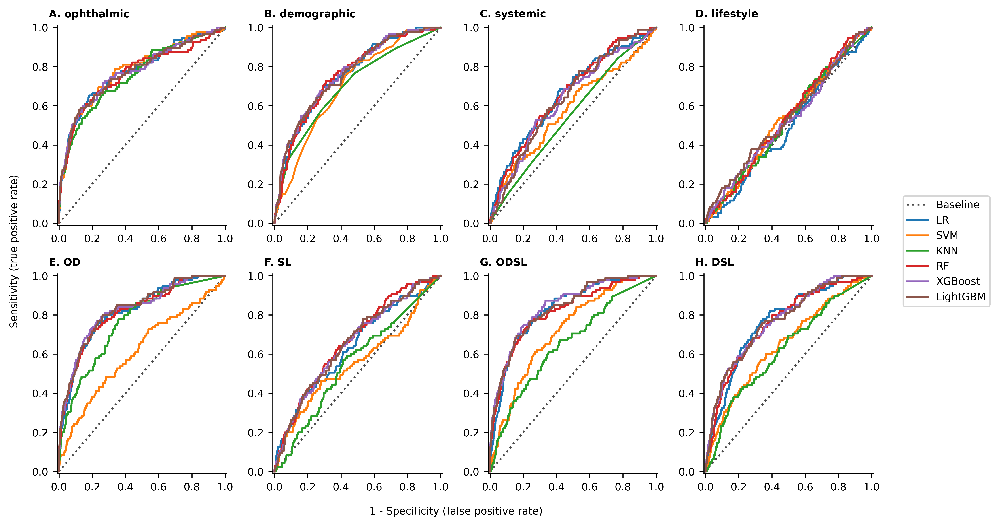

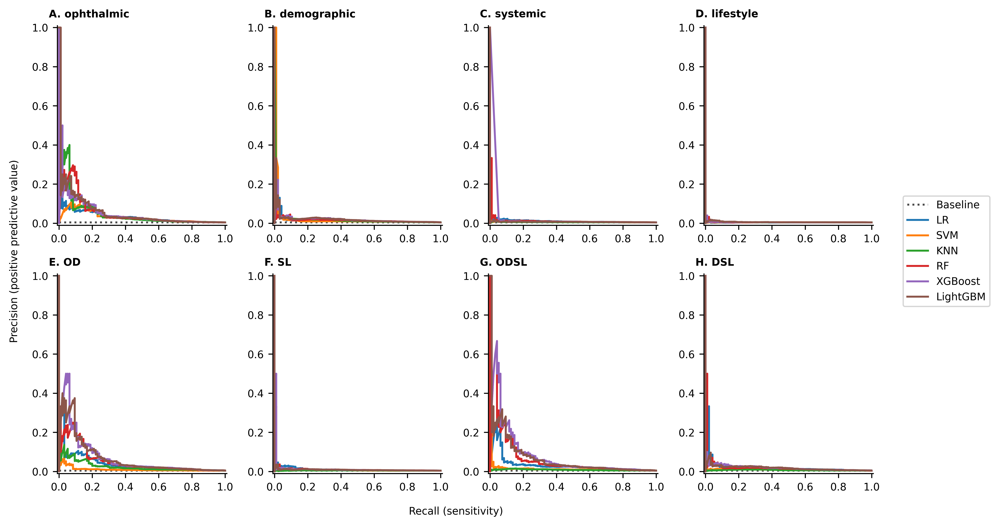

In [40]:
auroc_bar_fig, auroc_bar_axes = plt.subplots(4, 2, figsize=(35/2.54, 23/2.54), dpi=600, sharex=False, sharey=True)
roc_fig, roc_axes = plt.subplots(2, 4, figsize=(24/2.54, 14/2.54), dpi=600, sharex=False, sharey=False)
prc_fig, prc_axes = plt.subplots(2, 4, figsize=(24/2.54, 14/2.54), dpi=600, sharex=False, sharey=False)

auroc_bar_axes = auroc_bar_axes.flatten()
roc_axes = roc_axes.flatten()
prc_axes = prc_axes.flatten()

title_arr = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K']
#title_arr = ['i', 'ii', 'iii', 'iv', 'v', 'vi', 'vii', 'viii', 'ix', 'x']

for i, (feature_set_name, features) in zip(range(len(compare_feature_set_dict.items())), compare_feature_set_dict.items()):
    print(feature_set_name)
    
    subplot_title = title_arr[i]
    auroc_bar_ax = auroc_bar_axes[i]
    roc_ax = roc_axes[i]
    prc_ax = prc_axes[i]

    feature_set_dict = {}
    for display_name, algorithm in algorithm_display_names_rnfl5year_tte.items():
        feature_set_dict[display_name] = {
            'feature_set': feature_set_name,
            'save_dir': f'./{fitted_models_dir}/{feature_set_name}/{algorithm}',
            'algorithm': algorithm,
        }

    compare_models(
        feature_set_dict, f'./evaluation/{feature_set_name}',
        #X_test_imputed_scaled_rnfl5year_tte,
        #y_test_rnfl5year_tte,
        auroc_bar_ax=auroc_bar_ax, 
        roc_ax=roc_ax, 
        prc_ax=prc_ax,
    )
    
    auroc_bar_ax.text(-0.05, 1.03, f'{subplot_title}. {feature_set_name}', transform=auroc_bar_ax.transAxes, fontsize=8, fontweight='bold', va='bottom', ha='left')
    auroc_bar_ax.tick_params(axis='x', labelsize=8)
    auroc_bar_ax.tick_params(axis='y', labelsize=8)
    auroc_bar_ax.set_yticks(np.linspace(0, 1, 6))

    auroc_bar_ax.spines['top'].set_visible(False)
    auroc_bar_ax.spines['right'].set_visible(False)
    #auroc_bar_ax.spines['left'].set_visible(False)

    roc_ax.text(-0.05, 1.03, f'{subplot_title}. {feature_set_name}', transform=roc_ax.transAxes, fontsize=8, fontweight='bold', va='bottom', ha='left')
    roc_ax.tick_params(axis='x', labelsize=8)
    roc_ax.tick_params(axis='y', labelsize=8)
    roc_ax.set_xticks(np.linspace(0, 1, 6))
    roc_ax.set_yticks(np.linspace(0, 1, 6))
    roc_ax.spines['top'].set_visible(False)
    roc_ax.spines['right'].set_visible(False)

    prc_ax.text(-0.05, 1.03, f'{subplot_title}. {feature_set_name}', transform=prc_ax.transAxes, fontsize=8, fontweight='bold', va='bottom', ha='left')
    prc_ax.tick_params(axis='x', labelsize=8)
    prc_ax.tick_params(axis='y', labelsize=8)
    prc_ax.set_xticks(np.linspace(0, 1, 6))
    prc_ax.set_yticks(np.linspace(0, 1, 6))
    prc_ax.spines['top'].set_visible(False)
    prc_ax.spines['right'].set_visible(False)




# AUROC Bar
#auroc_bar_fig.yticks(np.linspace(0, 1, 6))
#auroc_bar_fig.tick_params(axis='y', labelsize=8)

legend_labels = ['Baseline (0.500)'] + list(algorithm_display_names_rnfl5year_tte.keys())

auroc_bar_fig.text(0.5, -0.01, 'Algorithm', ha='center', va='center', fontsize=8)
auroc_bar_fig.text(-0.01, 0.5, 'AUROC', ha='left', va='center', rotation='vertical', fontsize=8)
auroc_bar_fig.legend(loc='center', bbox_to_anchor=(1.01, 0, 0.1, 1), fontsize=8, labels=legend_labels, handles=roc_axes[0].lines)
auroc_bar_fig.tight_layout()
auroc_bar_fig.savefig(f'./evaluation/compare_feature_sets_auroc_bar_rnfl5year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
auroc_bar_fig.show()


# ROC
legend_labels = ['Baseline'] + list(algorithm_display_names_rnfl5year_tte.keys())

roc_fig.text(0.5, -0.01, '1 - Specificity (false positive rate)', ha='center', va='center', fontsize=8)
roc_fig.text(-0.01, 0.5, 'Sensitivity (true positive rate)', ha='left', va='center', rotation='vertical', fontsize=8)
roc_fig.legend(loc='center', bbox_to_anchor=(1.01, 0, 0.1, 1), fontsize=8, labels=legend_labels, handles=roc_axes[0].lines)
roc_fig.tight_layout()
roc_fig.savefig(f'./evaluation/compare_feature_sets_roc_rnfl5year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
roc_fig.show()

# PRC
prc_fig.text(0.5, -0.01, 'Recall (sensitivity)', ha='center', va='center', fontsize=8)
prc_fig.text(-0.01, 0.5, 'Precision (positive predictive value)', ha='left', va='center', rotation='vertical', fontsize=8)
prc_fig.legend(loc='center', bbox_to_anchor=(1.01, 0, 0.1, 1), fontsize=8, labels=legend_labels, handles=roc_axes[0].lines)
prc_fig.tight_layout()
prc_fig.savefig(f'./evaluation/compare_feature_sets_prc_rnfl5year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
prc_fig.show()

<br>

## No IOP RNFL model

In [43]:
model_feature_dict = compare_feature_set_dict = {
    'ophthalmic': feature_sets_rnfl.ophthalmic_features['feature'].values[~np.isin(feature_sets_rnfl.ophthalmic_features['feature'].values, ['IOPg pre-treatment', 'IOPg pre-treatment inter-eye difference'])],
    'demographic': feature_sets_rnfl.demographic_features['feature'].values,
    'systemic': feature_sets_rnfl.systemic_features['feature'].values,
    'lifestyle': feature_sets_rnfl.lifestyle_features['feature'].values,

    'OD': feature_sets_rnfl.OD_features['feature'].values[~np.isin(feature_sets_rnfl.OD_features['feature'].values, ['IOPg pre-treatment', 'IOPg pre-treatment inter-eye difference'])],
    'SL': feature_sets_rnfl.SL_features['feature'].values,
    'ODSL': feature_sets_rnfl.ODSL_features['feature'].values[~np.isin(feature_sets_rnfl.ODSL_features['feature'].values, ['IOPg pre-treatment', 'IOPg pre-treatment inter-eye difference'])],
    'DSL': feature_sets_rnfl.DSL_features['feature'].values}


In [44]:
def compare_models(model_dict, save_dir=None, auroc_bar_ax=None, roc_ax=None, prc_ax=None):
    model_df = pd.DataFrame(columns=['Model'])
    model_df = model_df.set_index('Model', drop=True)

    estimator_dict = {}

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)

    for model_name, model_properties in model_dict.items():
        print(model_name)

        feature_set = model_feature_dict[model_properties['feature_set']]
        X = X_test_imputed_scaled_5year_tte[feature_set]

        estimator = load(f'{model_properties['save_dir']}.pkl')
        with open(f'{model_properties['save_dir']}_best_params.txt', 'r') as txt:
            params = txt.read()
        
        test_scoring_metrics = get_scoring_metrics(estimator, X, y_test_5year_tte)
        probabilities = get_estimator_probabilities(estimator, X)
        auroc = test_scoring_metrics['roc_auc']
        auprc = test_scoring_metrics['pr_auc']

        t = model_util.get_ideal_threshold(y_test_5year_tte, probabilities)

        btstrp_measures = model_util.get_bootstrapped_measures(y_test_5year_tte, probabilities, t).confidence_interval
        auroc_CI_low, auprc_CI_low, sensitivity_CI_low, specificity_CI_low, ppv_CI_low, npv_CI_low, f1_CI_low = btstrp_measures.low
        auroc_CI_high, auprc_CI_high, sensitivity_CI_high, specificity_CI_high, ppv_CI_high, npv_CI_high, f1_CI_high = btstrp_measures.high

        model_df.loc[model_name, 'Algorithm'] = model_properties['algorithm']
        model_df.loc[model_name, 'Parameters'] = params
        model_df.loc[model_name, 'AUROC'] = auroc
        model_df.loc[model_name, 'AUROC (95% CI)'] = f'{auroc:0.3f} ({auroc_CI_low:0.3f} - {auroc_CI_high:0.3f})'
       
        model_df.loc[model_name, 'Sensitivity (95% CI)'] = (
            f'{test_scoring_metrics['sensitivity_recall']:0.3f} '
            f'({sensitivity_CI_low:0.3f} - {sensitivity_CI_high:0.3f})'
        )
        
        model_df.loc[model_name, 'Specificity (95% CI)'] = (
            f'{test_scoring_metrics['specificity']:0.3f} '
            f'({specificity_CI_low:0.3f} - {specificity_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'PPV (95% CI)'] = (
            f'{test_scoring_metrics['ppv_precision']:0.3f} '
            f'({ppv_CI_low:0.3f} - {ppv_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'NPV (95% CI)'] = (
            f'{test_scoring_metrics['npv']:0.3f} '
            f'({npv_CI_low:0.3f} - {npv_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'F1 score (95% CI)'] = (
            f'{test_scoring_metrics['f1_score']:0.3f} '
            f'({f1_CI_low:0.3f} - {f1_CI_high:0.3f})'
        )

        model_df.loc[model_name, 'AUPRC (95% CI)'] = (
            f'{auprc:0.3f} '
            f'({auprc_CI_low:0.3f} - {auprc_CI_high:0.3f})'
        )

        estimator_dict[model_name] = {
            'estimator': estimator,
            'model_name': model_name,
            'X': X,
            'probabilities': probabilities,
            'roc_label': f'{model_name}: {auroc:0.3f} ({auroc_CI_low:0.3f} - {auroc_CI_high:0.3f})',
            'prc_label': f'{model_name}: {auprc:0.3f} ({auprc_CI_low:0.3f} - {auprc_CI_high:0.3f})',

            'auroc': auroc,
            'auroc_CI_low': auroc_CI_low,
            'auroc_CI_high': auroc_CI_high,

            'auprc': auprc,
            'auprc_CI_low': auprc_CI_low,
            'auprc_CI_high': auprc_CI_high,

            'f1_score': test_scoring_metrics['f1_score'],
            'f1_CI_low': f1_CI_low,
            'f1_CI_high': f1_CI_high,
            
            'sensitivity_recall': test_scoring_metrics['sensitivity_recall'],
            'sensitivity_CI_low': sensitivity_CI_low,
            'sensitivity_CI_high': sensitivity_CI_high,
            
            'specificity': test_scoring_metrics['specificity'],
            'specificity_CI_low': specificity_CI_low,
            'specificity_CI_high': specificity_CI_high,
        }

    best_model = model_df['AUROC'].idxmax()
    best_model_dict = model_dict[best_model]
    best_model_algorithm = best_model_dict['algorithm']
    print(f'Best model: {best_model} ({best_model_algorithm})')

    if auroc_bar_ax != None:
        compare_estimator_auroc_bar(estimator_dict, y_test_5year_tte, best_model=best_model, ax=auroc_bar_ax)
    compare_estimator_roc(estimator_dict, y_test_5year_tte, ax=roc_ax)
    compare_estimator_prc(estimator_dict, y_test_5year_tte, ax=prc_ax)


    display(model_df.style.set_properties(**{
        'white-space': 'pre-wrap',
    }))

    if save_dir:
        model_df.to_csv(f'{save_dir}/comparison_results_noIOPrnfl5year_tte.tsv', sep='\t')
        # Save best model as txt
        with open(f'{save_dir}/best_model_noIOPrnfl5year_tte.txt', 'w+') as txt:
            txt.write(best_model)
        with open(f'{save_dir}/best_algorithm_noIOPrnfl5year_tte.txt', 'w+') as txt:
            txt.write(best_model_algorithm)

   # plt.show()

ophthalmic
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: XGBoost (xgboost_noIOPrnfl5year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_noIOPrnfl5year_tte,alpha: 1.018812541409904e-06 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.755757,0.756 (0.699 - 0.809),0.611 (0.510 - 0.710),0.817 (0.812 - 0.822),0.014 (0.011 - 0.018),0.998 (0.997 - 0.999),0.028 (0.021 - 0.035),0.022 (0.014 - 0.035)
SVM,svm_noIOPrnfl5year_tte,C: 1.9763427604553658 kernel: linear random_state: 2024 cache_size: 7000 max_iter: 1000,0.747070,0.747 (0.688 - 0.804),0.579 (0.479 - 0.680),0.851 (0.846 - 0.856),0.017 (0.013 - 0.021),0.998 (0.997 - 0.998),0.033 (0.024 - 0.041),0.021 (0.013 - 0.033)
KNN,knn_noIOPrnfl5year_tte,n_neighbors: 471 weights: distance metric: euclidean algorithm: brute,0.700598,0.701 (0.640 - 0.758),0.642 (0.543 - 0.738),0.688 (0.682 - 0.694),0.009 (0.007 - 0.011),0.998 (0.997 - 0.998),0.018 (0.013 - 0.022),0.029 (0.014 - 0.062)
RF,randomforest_noIOPrnfl5year_tte,n_estimators: 394 max_depth: 46 max_features: 0.9180050492596311 min_samples_leaf: 401 max_samples: 0.5545917430452392 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.751665,0.752 (0.690 - 0.810),0.600 (0.500 - 0.698),0.851 (0.846 - 0.856),0.017 (0.013 - 0.022),0.998 (0.997 - 0.999),0.034 (0.025 - 0.042),0.033 (0.018 - 0.060)
XGBoost,xgboost_noIOPrnfl5year_tte,n_estimators: 407 learning_rate: 0.010262584969264797 max_depth: 5 subsample: 0.527543329976267 colsample_bytree: 0.9388357558349738 gamma: 0.05921324797694047 lambda: 0.02399874040420443 min_child_weight: 13.183101206623911 max_bin: 495 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.766830,0.767 (0.710 - 0.821),0.589 (0.488 - 0.687),0.868 (0.864 - 0.873),0.019 (0.014 - 0.024),0.998 (0.997 - 0.999),0.037 (0.028 - 0.047),0.034 (0.019 - 0.060)
LightGBM,lightgbm_noIOPrnfl5year_tte,n_estimators: 53 max_bin: 455 learning_rate: 0.07584400477045658 max_depth: 4 num_leaves: 42 bagging_fraction: 0.6374721821201684 feature_fraction: 0.8080743170102728 lambda_l2: 0.08505818766680162 min_sum_hessian_in_leaf: 0.18926939302358295 min_data_in_leaf: 2070 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.748838,0.749 (0.689 - 0.806),0.642 (0.543 - 0.738),0.809 (0.804 - 0.815),0.015 (0.011 - 0.018),0.998 (0.997 - 0.999),0.028 (0.022 - 0.036),0.036 (0.019 - 0.066)


demographic
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: LR (logistic_regression_sgd_noIOPrnfl5year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_noIOPrnfl5year_tte,alpha: 1.0684319873974377e-06 learning_rate: adaptive eta0: 0.09796622513718432 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.775438,0.775 (0.731 - 0.818),0.695 (0.600 - 0.785),0.731 (0.725 - 0.737),0.011 (0.009 - 0.014),0.998 (0.997 - 0.999),0.022 (0.017 - 0.027),0.019 (0.011 - 0.042)
SVM,svm_noIOPrnfl5year_tte,C: 0.3596685941104881 kernel: linear random_state: 2024 cache_size: 7000 max_iter: 1000,0.493872,0.494 (0.435 - 0.552),0.516 (0.413 - 0.616),0.525 (0.518 - 0.531),0.005 (0.003 - 0.006),0.996 (0.995 - 0.997),0.009 (0.007 - 0.012),0.004 (0.003 - 0.005)
KNN,knn_noIOPrnfl5year_tte,n_neighbors: 499 weights: distance metric: manhattan algorithm: brute,0.708708,0.709 (0.654 - 0.761),0.832 (0.752 - 0.904),0.491 (0.484 - 0.498),0.007 (0.006 - 0.009),0.998 (0.998 - 0.999),0.014 (0.011 - 0.017),0.011 (0.008 - 0.017)
RF,randomforest_noIOPrnfl5year_tte,n_estimators: 267 max_depth: 28 max_features: 0.719281992513639 min_samples_leaf: 1110 max_samples: 0.793799819285454 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.762856,0.763 (0.717 - 0.807),0.737 (0.647 - 0.824),0.683 (0.677 - 0.689),0.010 (0.008 - 0.012),0.998 (0.998 - 0.999),0.020 (0.016 - 0.025),0.015 (0.010 - 0.024)
XGBoost,xgboost_noIOPrnfl5year_tte,n_estimators: 179 learning_rate: 0.015481840110375986 max_depth: 3 subsample: 0.7937294384144514 colsample_bytree: 0.969890152106816 gamma: 0.015602748660208715 lambda: 1.9879369932186233 min_child_weight: 0.0010628702252643907 max_bin: 953 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.771962,0.772 (0.726 - 0.817),0.758 (0.670 - 0.842),0.662 (0.656 - 0.668),0.010 (0.008 - 0.012),0.998 (0.998 - 0.999),0.019 (0.015 - 0.024),0.029 (0.012 - 0.059)
LightGBM,lightgbm_noIOPrnfl5year_tte,n_estimators: 86 max_bin: 729 learning_rate: 0.020679451943037847 max_depth: 5 num_leaves: 64 bagging_fraction: 0.9614675739187375 feature_fraction: 0.9660081700849774 lambda_l2: 0.0011051491145423827 min_sum_hessian_in_leaf: 1.3040831607638743 min_data_in_leaf: 2114 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.763666,0.764 (0.719 - 0.808),0.789 (0.706 - 0.870),0.641 (0.634 - 0.647),0.010 (0.007 - 0.012),0.999 (0.998 - 0.999),0.019 (0.015 - 0.023),0.017 (0.011 - 0.030)


systemic
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: RF (randomforest_noIOPrnfl5year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_noIOPrnfl5year_tte,alpha: 2.1318391916722472e-05 learning_rate: adaptive eta0: 0.09522540450583555 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.652086,0.652 (0.594 - 0.709),0.716 (0.624 - 0.803),0.539 (0.533 - 0.546),0.007 (0.005 - 0.008),0.998 (0.997 - 0.999),0.013 (0.010 - 0.017),0.009 (0.006 - 0.013)
SVM,svm_noIOPrnfl5year_tte,C: 4.408606118163591e-06 kernel: rbf gamma: 1.8080155230059503 random_state: 2024 cache_size: 7000 max_iter: 1000,0.609130,0.609 (0.550 - 0.667),0.368 (0.272 - 0.467),0.818 (0.813 - 0.823),0.009 (0.006 - 0.012),0.997 (0.996 - 0.997),0.017 (0.012 - 0.023),0.007 (0.005 - 0.010)
KNN,knn_noIOPrnfl5year_tte,n_neighbors: 401 weights: uniform metric: euclidean algorithm: brute,0.551864,0.552 (0.498 - 0.606),0.832 (0.752 - 0.903),0.249 (0.243 - 0.255),0.005 (0.004 - 0.006),0.997 (0.996 - 0.998),0.010 (0.008 - 0.012),0.011 (0.004 - 0.028)
RF,randomforest_noIOPrnfl5year_tte,n_estimators: 128 max_depth: 31 max_features: 0.39361109847859205 min_samples_leaf: 4471 max_samples: 0.9641949660639569 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.665743,0.666 (0.614 - 0.718),0.684 (0.590 - 0.778),0.607 (0.601 - 0.614),0.008 (0.006 - 0.009),0.998 (0.997 - 0.998),0.015 (0.012 - 0.019),0.009 (0.006 - 0.014)
XGBoost,xgboost_noIOPrnfl5year_tte,n_estimators: 85 learning_rate: 0.001798907628482276 max_depth: 3 subsample: 0.7952543150421206 colsample_bytree: 0.8256720582175502 gamma: 0.02554471329021828 lambda: 0.0020882823483570744 min_child_weight: 1.8566474553674166 max_bin: 928 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.662444,0.662 (0.611 - 0.714),0.632 (0.535 - 0.728),0.654 (0.647 - 0.660),0.008 (0.006 - 0.010),0.998 (0.997 - 0.998),0.016 (0.012 - 0.020),0.008 (0.006 - 0.011)
LightGBM,lightgbm_noIOPrnfl5year_tte,n_estimators: 323 max_bin: 311 learning_rate: 0.0011742122559436413 max_depth: 3 num_leaves: 90 bagging_fraction: 0.954757048967992 feature_fraction: 0.7139504187504617 lambda_l2: 0.0011935376085170377 min_sum_hessian_in_leaf: 9.17717743435658 min_data_in_leaf: 4198 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.660436,0.660 (0.608 - 0.712),0.705 (0.612 - 0.795),0.561 (0.554 - 0.567),0.007 (0.005 - 0.009),0.998 (0.997 - 0.999),0.014 (0.011 - 0.017),0.009 (0.006 - 0.022)


lifestyle
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: RF (randomforest_noIOPrnfl5year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_noIOPrnfl5year_tte,alpha: 5.568850665435473e-05 learning_rate: constant eta0: 0.018579626478863225 loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.524079,0.524 (0.468 - 0.580),0.684 (0.589 - 0.774),0.393 (0.386 - 0.399),0.005 (0.004 - 0.006),0.996 (0.995 - 0.998),0.010 (0.007 - 0.012),0.005 (0.004 - 0.009)
SVM,svm_noIOPrnfl5year_tte,C: 2.145080365697877e-06 kernel: rbf gamma: 0.29097511869072773 random_state: 2024 cache_size: 7000 max_iter: 1000,0.439988,0.440 (0.379 - 0.502),0.211 (0.132 - 0.297),0.811 (0.806 - 0.816),0.005 (0.003 - 0.007),0.996 (0.995 - 0.997),0.009 (0.006 - 0.014),0.004 (0.003 - 0.006)
KNN,knn_noIOPrnfl5year_tte,n_neighbors: 337 weights: uniform metric: cosine algorithm: brute,0.542852,0.543 (0.488 - 0.596),0.526 (0.424 - 0.624),0.577 (0.571 - 0.584),0.005 (0.004 - 0.007),0.996 (0.995 - 0.997),0.011 (0.008 - 0.014),0.005 (0.004 - 0.006)
RF,randomforest_noIOPrnfl5year_tte,n_estimators: 383 max_depth: 38 max_features: 0.8502401004659573 min_samples_leaf: 16 max_samples: 0.7373350991221221 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.565102,0.565 (0.507 - 0.622),0.589 (0.489 - 0.686),0.561 (0.554 - 0.568),0.006 (0.004 - 0.007),0.997 (0.996 - 0.998),0.012 (0.009 - 0.015),0.006 (0.004 - 0.013)
XGBoost,xgboost_noIOPrnfl5year_tte,n_estimators: 223 learning_rate: 0.07190866483922312 max_depth: 11 subsample: 0.920579788776277 colsample_bytree: 0.5904261470801961 gamma: 0.02802270653400445 lambda: 0.4499407148977795 min_child_weight: 0.0002790587164341094 max_bin: 513 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.551210,0.551 (0.488 - 0.611),0.232 (0.150 - 0.317),0.872 (0.867 - 0.876),0.008 (0.005 - 0.011),0.996 (0.995 - 0.997),0.015 (0.009 - 0.022),0.005 (0.004 - 0.007)
LightGBM,lightgbm_noIOPrnfl5year_tte,n_estimators: 473 max_bin: 604 learning_rate: 0.19942903320826405 max_depth: 11 num_leaves: 107 bagging_fraction: 0.8768268309528295 feature_fraction: 0.7855834056445645 lambda_l2: 14.333797129528476 min_sum_hessian_in_leaf: 0.008709527391333294 min_data_in_leaf: 2510 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.538412,0.538 (0.476 - 0.599),0.695 (0.600 - 0.787),0.424 (0.418 - 0.431),0.005 (0.004 - 0.007),0.997 (0.996 - 0.998),0.010 (0.008 - 0.013),0.005 (0.004 - 0.007)


OD
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: LightGBM (lightgbm_noIOPrnfl5year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_noIOPrnfl5year_tte,alpha: 1.041962830659638e-06 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.806072,0.806 (0.763 - 0.846),0.642 (0.543 - 0.740),0.827 (0.822 - 0.832),0.016 (0.012 - 0.020),0.998 (0.997 - 0.999),0.031 (0.024 - 0.039),0.022 (0.014 - 0.038)
SVM,svm_noIOPrnfl5year_tte,C: 0.614783897548561 kernel: linear random_state: 2024 cache_size: 7000 max_iter: 1000,0.559503,0.560 (0.499 - 0.619),0.221 (0.139 - 0.307),0.903 (0.900 - 0.907),0.010 (0.006 - 0.014),0.996 (0.995 - 0.997),0.019 (0.011 - 0.027),0.007 (0.004 - 0.012)
KNN,knn_noIOPrnfl5year_tte,n_neighbors: 477 weights: distance metric: manhattan algorithm: brute,0.714789,0.715 (0.663 - 0.765),0.768 (0.681 - 0.851),0.591 (0.585 - 0.598),0.008 (0.006 - 0.010),0.998 (0.998 - 0.999),0.016 (0.013 - 0.020),0.011 (0.008 - 0.016)
RF,randomforest_noIOPrnfl5year_tte,n_estimators: 68 max_depth: 45 max_features: 0.561329137768402 min_samples_leaf: 157 max_samples: 0.9324018425283103 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.806817,0.807 (0.757 - 0.853),0.789 (0.703 - 0.871),0.715 (0.709 - 0.722),0.012 (0.009 - 0.015),0.999 (0.998 - 0.999),0.024 (0.019 - 0.029),0.030 (0.019 - 0.048)
XGBoost,xgboost_noIOPrnfl5year_tte,n_estimators: 180 learning_rate: 0.0313246032684813 max_depth: 4 subsample: 0.6635789607772361 colsample_bytree: 0.8083492680163759 gamma: 0.14667001834052765 lambda: 0.643376513923371 min_child_weight: 2.3790956679500965 max_bin: 477 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.814276,0.814 (0.767 - 0.859),0.789 (0.706 - 0.870),0.735 (0.729 - 0.741),0.013 (0.010 - 0.016),0.999 (0.998 - 0.999),0.025 (0.020 - 0.031),0.048 (0.026 - 0.085)
LightGBM,lightgbm_noIOPrnfl5year_tte,n_estimators: 201 max_bin: 410 learning_rate: 0.03160822857053894 max_depth: 3 num_leaves: 120 bagging_fraction: 0.5882208349651991 feature_fraction: 0.9875842634384253 lambda_l2: 6.4307124008483365 min_sum_hessian_in_leaf: 0.00017670277231592312 min_data_in_leaf: 1003 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.821608,0.822 (0.775 - 0.866),0.758 (0.670 - 0.843),0.767 (0.761 - 0.772),0.014 (0.011 - 0.017),0.999 (0.998 - 0.999),0.028 (0.022 - 0.034),0.049 (0.027 - 0.090)


SL
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: RF (randomforest_noIOPrnfl5year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_noIOPrnfl5year_tte,alpha: 4.477700885504925e-06 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.601716,0.602 (0.542 - 0.662),0.526 (0.423 - 0.628),0.632 (0.626 - 0.639),0.006 (0.005 - 0.008),0.997 (0.996 - 0.998),0.012 (0.009 - 0.016),0.009 (0.006 - 0.015)
SVM,svm_noIOPrnfl5year_tte,C: 0.0021421891504540963 kernel: rbf gamma: 0.871723923983804 random_state: 2024 cache_size: 7000 max_iter: 1000,0.564885,0.565 (0.504 - 0.627),0.358 (0.261 - 0.455),0.777 (0.771 - 0.783),0.007 (0.005 - 0.009),0.996 (0.995 - 0.997),0.014 (0.009 - 0.018),0.006 (0.004 - 0.008)
KNN,knn_noIOPrnfl5year_tte,n_neighbors: 479 weights: distance metric: euclidean algorithm: brute,0.553511,0.554 (0.497 - 0.611),0.589 (0.490 - 0.686),0.535 (0.529 - 0.542),0.006 (0.004 - 0.007),0.997 (0.996 - 0.998),0.011 (0.008 - 0.014),0.005 (0.004 - 0.007)
RF,randomforest_noIOPrnfl5year_tte,n_estimators: 484 max_depth: 5 max_features: 0.3197993358894703 min_samples_leaf: 1903 max_samples: 0.7890473766113398 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.668986,0.669 (0.617 - 0.722),0.789 (0.705 - 0.870),0.488 (0.481 - 0.495),0.007 (0.005 - 0.008),0.998 (0.997 - 0.999),0.013 (0.010 - 0.016),0.013 (0.007 - 0.043)
XGBoost,xgboost_noIOPrnfl5year_tte,n_estimators: 465 learning_rate: 0.001467362129519667 max_depth: 4 subsample: 0.720780154453549 colsample_bytree: 0.781153552101863 gamma: 0.0009684607625105817 lambda: 0.03718437575989348 min_child_weight: 0.0028315429066621566 max_bin: 841 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.666017,0.666 (0.612 - 0.720),0.737 (0.647 - 0.824),0.521 (0.515 - 0.528),0.007 (0.005 - 0.008),0.998 (0.997 - 0.999),0.013 (0.010 - 0.016),0.012 (0.007 - 0.029)
LightGBM,lightgbm_noIOPrnfl5year_tte,n_estimators: 118 max_bin: 881 learning_rate: 0.010139381064906468 max_depth: 3 num_leaves: 114 bagging_fraction: 0.9999698302466132 feature_fraction: 0.6155935634695565 lambda_l2: 0.3139280585574141 min_sum_hessian_in_leaf: 0.5827997312498365 min_data_in_leaf: 4143 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.654500,0.655 (0.599 - 0.710),0.484 (0.385 - 0.587),0.764 (0.758 - 0.769),0.009 (0.007 - 0.012),0.997 (0.996 - 0.998),0.017 (0.013 - 0.023),0.020 (0.006 - 0.046)


ODSL
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: LightGBM (lightgbm_noIOPrnfl5year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_noIOPrnfl5year_tte,alpha: 1.0438097787658363e-06 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.779025,0.779 (0.732 - 0.825),0.621 (0.521 - 0.717),0.811 (0.806 - 0.817),0.014 (0.011 - 0.018),0.998 (0.997 - 0.999),0.028 (0.021 - 0.035),0.025 (0.014 - 0.051)
SVM,svm_noIOPrnfl5year_tte,C: 0.15008200714525205 kernel: linear random_state: 2024 cache_size: 7000 max_iter: 1000,0.619832,0.620 (0.557 - 0.679),0.495 (0.394 - 0.598),0.698 (0.692 - 0.704),0.007 (0.005 - 0.009),0.997 (0.996 - 0.998),0.014 (0.010 - 0.018),0.010 (0.006 - 0.017)
KNN,knn_noIOPrnfl5year_tte,n_neighbors: 437 weights: distance metric: manhattan algorithm: brute,0.649332,0.649 (0.593 - 0.704),0.389 (0.292 - 0.489),0.828 (0.824 - 0.834),0.010 (0.007 - 0.013),0.997 (0.996 - 0.998),0.019 (0.013 - 0.025),0.008 (0.006 - 0.012)
RF,randomforest_noIOPrnfl5year_tte,n_estimators: 380 max_depth: 9 max_features: 0.8083136304993315 min_samples_leaf: 194 max_samples: 0.8218492765464963 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.796447,0.796 (0.748 - 0.842),0.684 (0.586 - 0.778),0.784 (0.778 - 0.789),0.014 (0.010 - 0.017),0.998 (0.998 - 0.999),0.027 (0.021 - 0.033),0.024 (0.016 - 0.038)
XGBoost,xgboost_noIOPrnfl5year_tte,n_estimators: 441 learning_rate: 0.006008295925072284 max_depth: 6 subsample: 0.8334331839398229 colsample_bytree: 0.7323777066565977 gamma: 0.015585992695274716 lambda: 0.002343508487252561 min_child_weight: 4.763417077489134 max_bin: 213 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.823992,0.824 (0.781 - 0.865),0.747 (0.656 - 0.835),0.776 (0.771 - 0.782),0.014 (0.011 - 0.018),0.999 (0.998 - 0.999),0.028 (0.022 - 0.035),0.050 (0.027 - 0.096)
LightGBM,lightgbm_noIOPrnfl5year_tte,n_estimators: 486 max_bin: 846 learning_rate: 0.012173457548864232 max_depth: 4 num_leaves: 123 bagging_fraction: 0.6800133787214961 feature_fraction: 0.6035286328146305 lambda_l2: 2.9556893085593186 min_sum_hessian_in_leaf: 0.00035061000479080426 min_data_in_leaf: 1865 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.829985,0.830 (0.788 - 0.869),0.779 (0.693 - 0.862),0.737 (0.731 - 0.743),0.013 (0.010 - 0.016),0.999 (0.998 - 0.999),0.025 (0.020 - 0.031),0.054 (0.026 - 0.100)


DSL
LR
SVM
KNN
RF
XGBoost
LightGBM
Best model: LR (logistic_regression_sgd_noIOPrnfl5year_tte)


,Algorithm,Parameters,AUROC,AUROC (95% CI),Sensitivity (95% CI),Specificity (95% CI),PPV (95% CI),NPV (95% CI),F1 score (95% CI),AUPRC (95% CI)
Model,,,,,,,,,,
LR,logistic_regression_sgd_noIOPrnfl5year_tte,alpha: 6.089457050615361e-06 learning_rate: optimal loss: log_loss penalty: l2 fit_intercept: True tol: 0.0001 n_iter_no_change: 5,0.776844,0.777 (0.731 - 0.820),0.779 (0.691 - 0.860),0.669 (0.663 - 0.676),0.010 (0.008 - 0.013),0.999 (0.998 - 0.999),0.020 (0.016 - 0.025),0.018 (0.011 - 0.032)
SVM,svm_noIOPrnfl5year_tte,C: 0.0030462727475098306 kernel: rbf gamma: 0.03208390075616329 random_state: 2024 cache_size: 7000 max_iter: 1000,0.534158,0.534 (0.472 - 0.597),0.589 (0.491 - 0.687),0.506 (0.499 - 0.512),0.005 (0.004 - 0.007),0.996 (0.995 - 0.998),0.010 (0.008 - 0.013),0.006 (0.004 - 0.008)
KNN,knn_noIOPrnfl5year_tte,n_neighbors: 431 weights: uniform metric: manhattan algorithm: brute,0.646726,0.647 (0.591 - 0.701),0.411 (0.312 - 0.511),0.782 (0.777 - 0.788),0.008 (0.006 - 0.011),0.997 (0.996 - 0.998),0.016 (0.011 - 0.021),0.008 (0.006 - 0.012)
RF,randomforest_noIOPrnfl5year_tte,n_estimators: 438 max_depth: 19 max_features: 0.9157745858685168 min_samples_leaf: 1636 max_samples: 0.8208100477566267 n_jobs: -1 criterion: gini bootstrap: True random_state: 2024,0.753828,0.754 (0.704 - 0.801),0.674 (0.579 - 0.767),0.719 (0.713 - 0.725),0.010 (0.008 - 0.013),0.998 (0.997 - 0.999),0.020 (0.016 - 0.025),0.014 (0.010 - 0.023)
XGBoost,xgboost_noIOPrnfl5year_tte,n_estimators: 430 learning_rate: 0.05862533635422474 max_depth: 3 subsample: 0.7869551905256105 colsample_bytree: 0.7908504840049244 gamma: 0.822625317693047 lambda: 455.0772225666147 min_child_weight: 0.0008553533912067714 max_bin: 234 n_jobs: -1 enable_categorical: True objective: binary:logistic booster: gbtree tree_method: hist seed: 2024,0.775625,0.776 (0.730 - 0.821),0.789 (0.706 - 0.870),0.614 (0.608 - 0.620),0.009 (0.007 - 0.011),0.999 (0.998 - 0.999),0.018 (0.014 - 0.022),0.021 (0.012 - 0.043)
LightGBM,lightgbm_noIOPrnfl5year_tte,n_estimators: 329 max_bin: 422 learning_rate: 0.0063178458776137255 max_depth: 3 num_leaves: 12 bagging_fraction: 0.8269396637318926 feature_fraction: 0.9843892235044455 lambda_l2: 0.0017326161470084763 min_sum_hessian_in_leaf: 0.00011846197688335726 min_data_in_leaf: 1268 n_jobs: -1 bagging_freq: 1 force_row_wise: True bagging_seed: 2024 verbosity: -100 extra_trees: False,0.772160,0.772 (0.726 - 0.816),0.737 (0.647 - 0.823),0.686 (0.679 - 0.692),0.010 (0.008 - 0.013),0.998 (0.998 - 0.999),0.020 (0.016 - 0.025),0.018 (0.011 - 0.029)


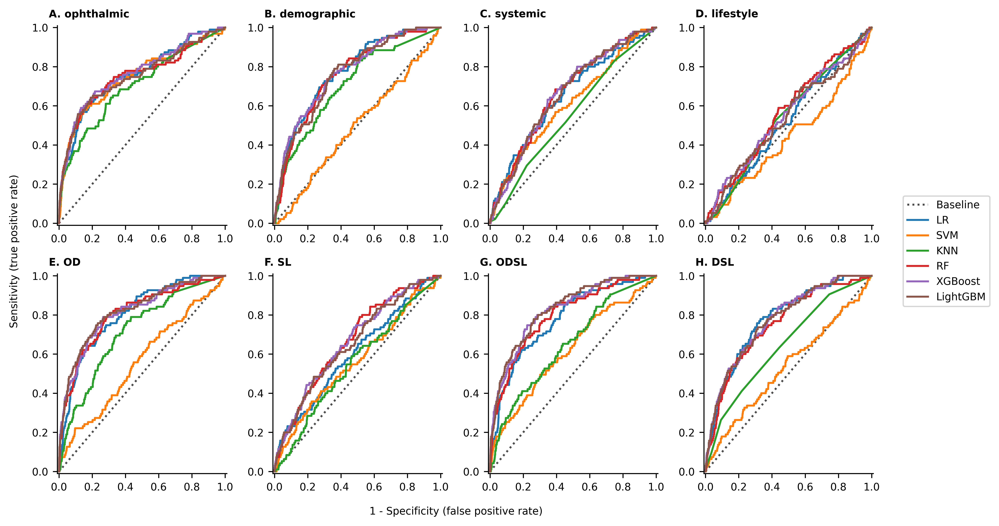

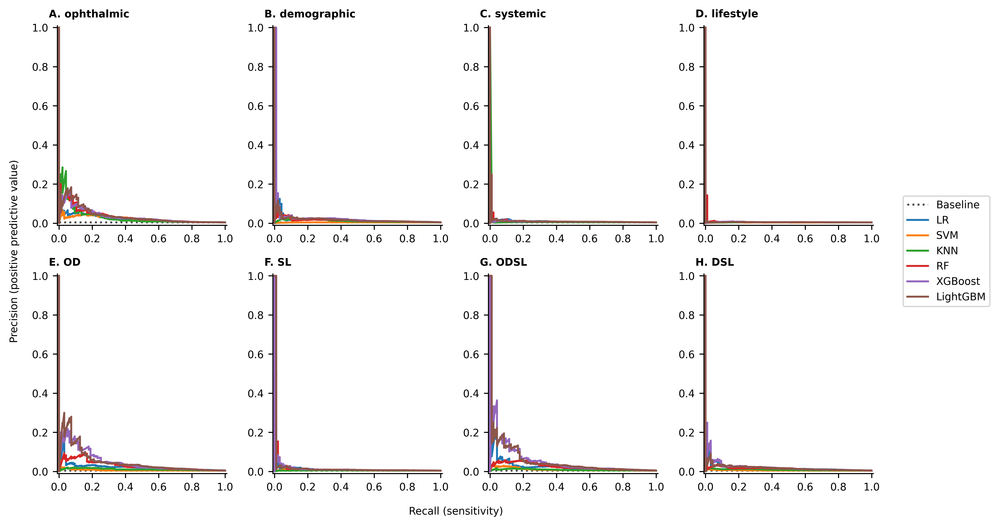

In [45]:
auroc_bar_fig, auroc_bar_axes = plt.subplots(4, 2, figsize=(35/2.54, 23/2.54), dpi=600, sharex=False, sharey=True)
roc_fig, roc_axes = plt.subplots(2, 4, figsize=(24/2.54, 14/2.54), dpi=600, sharex=False, sharey=False)
prc_fig, prc_axes = plt.subplots(2, 4, figsize=(24/2.54, 14/2.54), dpi=600, sharex=False, sharey=False)


auroc_bar_axes = auroc_bar_axes.flatten()
roc_axes = roc_axes.flatten()
prc_axes = prc_axes.flatten()

title_arr = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K']
#title_arr = ['i', 'ii', 'iii', 'iv', 'v', 'vi', 'vii', 'viii', 'ix', 'x']

for i, (feature_set_name, features) in zip(range(len(compare_feature_set_dict.items())), compare_feature_set_dict.items()):
    print(feature_set_name)
    
    subplot_title = title_arr[i]
    auroc_bar_ax = auroc_bar_axes[i]
    roc_ax = roc_axes[i]
    prc_ax = prc_axes[i]

    feature_set_dict = {}
    for display_name, algorithm in algorithm_display_names_5year_tte.items():
        feature_set_dict[display_name] = {
            'feature_set': feature_set_name,
            'save_dir': f'./{fitted_models_dir}/{feature_set_name}/{algorithm}',
            'algorithm': algorithm,
        }

    compare_models(
        feature_set_dict, f'./evaluation/{feature_set_name}',
        #X_test_imputed_scaled_5year_tte,
        #y_test_5year_tte,
        auroc_bar_ax=auroc_bar_ax, 
        roc_ax=roc_ax, 
        prc_ax=prc_ax,
    )
    
    auroc_bar_ax.text(-0.05, 1.03, f'{subplot_title}. {feature_set_name}', transform=auroc_bar_ax.transAxes, fontsize=8, fontweight='bold', va='bottom', ha='left')
    auroc_bar_ax.tick_params(axis='x', labelsize=8)
    auroc_bar_ax.tick_params(axis='y', labelsize=8)
    auroc_bar_ax.set_yticks(np.linspace(0, 1, 6))

    auroc_bar_ax.spines['top'].set_visible(False)
    auroc_bar_ax.spines['right'].set_visible(False)
    #auroc_bar_ax.spines['left'].set_visible(False)

    roc_ax.text(-0.05, 1.03, f'{subplot_title}. {feature_set_name}', transform=roc_ax.transAxes, fontsize=8, fontweight='bold', va='bottom', ha='left')
    roc_ax.tick_params(axis='x', labelsize=8)
    roc_ax.tick_params(axis='y', labelsize=8)
    roc_ax.set_xticks(np.linspace(0, 1, 6))
    roc_ax.set_yticks(np.linspace(0, 1, 6))
    roc_ax.spines['top'].set_visible(False)
    roc_ax.spines['right'].set_visible(False)

    prc_ax.text(-0.05, 1.03, f'{subplot_title}. {feature_set_name}', transform=prc_ax.transAxes, fontsize=8, fontweight='bold', va='bottom', ha='left')
    prc_ax.tick_params(axis='x', labelsize=8)
    prc_ax.tick_params(axis='y', labelsize=8)
    prc_ax.set_xticks(np.linspace(0, 1, 6))
    prc_ax.set_yticks(np.linspace(0, 1, 6))
    prc_ax.spines['top'].set_visible(False)
    prc_ax.spines['right'].set_visible(False)




# AUROC Bar
#auroc_bar_fig.yticks(np.linspace(0, 1, 6))
#auroc_bar_fig.tick_params(axis='y', labelsize=8)

legend_labels = ['Baseline (0.500)'] + list(algorithm_display_names_5year_tte.keys())

auroc_bar_fig.text(0.5, -0.01, 'Algorithm', ha='center', va='center', fontsize=8)
auroc_bar_fig.text(-0.01, 0.5, 'AUROC', ha='left', va='center', rotation='vertical', fontsize=8)
auroc_bar_fig.legend(loc='center', bbox_to_anchor=(1.01, 0, 0.1, 1), fontsize=8, labels=legend_labels, handles=roc_axes[0].lines)
auroc_bar_fig.tight_layout()
auroc_bar_fig.savefig(f'./evaluation/compare_feature_sets_auroc_bar_noIOPrnfl5year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
auroc_bar_fig.show()


# ROC
legend_labels = ['Baseline'] + list(algorithm_display_names_5year_tte.keys())

roc_fig.text(0.5, -0.01, '1 - Specificity (false positive rate)', ha='center', va='center', fontsize=8)
roc_fig.text(-0.01, 0.5, 'Sensitivity (true positive rate)', ha='left', va='center', rotation='vertical', fontsize=8)
roc_fig.legend(loc='center', bbox_to_anchor=(1.01, 0, 0.1, 1), fontsize=8, labels=legend_labels, handles=roc_axes[0].lines)
roc_fig.tight_layout()
roc_fig.savefig(f'./evaluation/compare_feature_sets_roc_noIOPrnfl5year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
roc_fig.show()

# PRC
prc_fig.text(0.5, -0.01, 'Recall (sensitivity)', ha='center', va='center', fontsize=8)
prc_fig.text(-0.01, 0.5, 'Precision (positive predictive value)', ha='left', va='center', rotation='vertical', fontsize=8)
prc_fig.legend(loc='center', bbox_to_anchor=(1.01, 0, 0.1, 1), fontsize=8, labels=legend_labels, handles=roc_axes[0].lines)
prc_fig.tight_layout()
prc_fig.savefig(f'./evaluation/compare_feature_sets_prc_noIOPrnfl5year_tte.png', dpi=600, bbox_inches='tight', pad_inches=0)
prc_fig.show()